
# 1. Business Problem

Dataset: 
Term - deposit marketing campaign data of a Porteguese banking institution.
Problem Statement: The business problem is a binary classification problem. The classification goal is to predict if the client contacted through the marketing campaign will subscribe a term deposit.

In [1]:
#IMPORTING THE NECESSARY LIBRARIES

import numpy as np 
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from prettytable import PrettyTable
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV 
from sklearn.metrics import roc_auc_score  
from sklearn.metrics import accuracy_score
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegressio n
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_curve 
from sklearn.metrics import log_loss
import warnings
warnings.filterwarnings('ignore') 

In [2]:
data = pd.read_csv('bank-full.csv')

In [4]:
data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [5]:
data.shape # 45211 rows and 17 columns

(45211, 17)

In [6]:
data.info() # No null values in the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
age          45211 non-null int64
job          45211 non-null object
marital      45211 non-null object
education    45211 non-null object
default      45211 non-null object
balance      45211 non-null int64
housing      45211 non-null object
loan         45211 non-null object
contact      45211 non-null object
day          45211 non-null int64
month        45211 non-null object
duration     45211 non-null int64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null object
Target       45211 non-null object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


# Dataset Description
The data is related with direct marketing campaigns of a Portuguese banking institution. The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be (or not) subscribed.

Attribute/Features Description:

Dataset have 17 attributes including one dependent attribute and there are 45211 instances/datapoints. So we have 16 independent attributes and 1 dependent attribute.

Bank client attributes:

Age: age of client (numeric)

Job : type of job (categorical: "admin.", "unknown", "unemployed", "management", "housemaid", "entrepreneur", "student", "blue-collar", "self-employed", "retired", "technician", "services")

Marital : marital status (categorical: "married", "divorced", "single")
education: client highest education (categorical: "unknown", "secondary", "primary", "tertiary")

Default: has credit in default? (binary/2-categories: "yes", "no")

Balance: average yearly balance, in euros (numeric)

Housing: has housing loan? (binary/2-categories: "yes", "no")

Loan: has personal loan? (binary/2-categories: "yes", "no")
related with the last contact of the current campaign:

Contact: contact communication type (categorical: "unknown", "telephone", "cellular")

Day: last contact day of the month (numeric)

Month: last contact month of year (categorical: "jan", "feb", "mar", ..., "nov", "dec")

Duration: last contact duration, in seconds (numeric)

Other attributes:


Campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

Pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric, -1 means client was not previously contacted)

Previous: number of contacts performed before this campaign and for this client (numeric)

Poutcome: outcome of the previous marketing campaign ( categorical: 'unknown","other", "failure", "success")

Output variable (desired target):
y: has the client subscribed a term deposit? (binary: "yes", "no")

In [7]:
#Checking any null balnces
data.isnull().any()


age          False
job          False
marital      False
education    False
default      False
balance      False
housing      False
loan         False
contact      False
day          False
month        False
duration     False
campaign     False
pdays        False
previous     False
poutcome     False
Target       False
dtype: bool

In [8]:
data.describe().T # Eye balling the data

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


In [291]:
#finding unique data 
data.apply(lambda x: len(x.unique()))

age            77
job            12
marital         3
education       4
default         2
balance      7168
housing         2
loan            2
contact         3
day            31
month          12
duration     1573
campaign       48
pdays         559
previous       41
poutcome        4
Target          2
age_group       4
dtype: int64

# Knowing the categorical variables

In [9]:
data['job'].unique()

array(['management', 'technician', 'entrepreneur', 'blue-collar',
       'unknown', 'retired', 'admin.', 'services', 'self-employed',
       'unemployed', 'housemaid', 'student'], dtype=object)

In [10]:
data['marital'].unique()

array(['married', 'single', 'divorced'], dtype=object)

In [11]:
data['education'].unique()

array(['tertiary', 'secondary', 'unknown', 'primary'], dtype=object)

In [12]:
data['default'].unique()

array(['no', 'yes'], dtype=object)

In [13]:
data['housing'].unique()

array(['yes', 'no'], dtype=object)

In [14]:
data['loan'].unique()

array(['no', 'yes'], dtype=object)

In [15]:
data['contact'].unique()

array(['unknown', 'cellular', 'telephone'], dtype=object)

In [16]:
data['month'].unique()

array(['may', 'jun', 'jul', 'aug', 'oct', 'nov', 'dec', 'jan', 'feb',
       'mar', 'apr', 'sep'], dtype=object)

In [17]:
data['poutcome'].unique()

array(['unknown', 'failure', 'other', 'success'], dtype=object)

In [18]:
data['Target'].unique()

array(['no', 'yes'], dtype=object)

In [20]:
import pandas_profiling
data.profile_report()#Detailed Exploratory Data Analysis  


Previous is highly skewed (γ1 = 41.84645447).
Job has 5171 (11.4%) zeros.
Balance has 3514 (7.8%) zeros.
Month has 2932 (6.5%) zeros	Zeros.
Previous has 36954 (81.7%) zeros.	


In [21]:
#Trying to find max and min values for age 
print('Min age: ', data['age'].max())
print('Max age: ', data['age'].min())
 

Min age:  95
Max age:  18


In [22]:
#creating bins for age

lst = [data]   
for column in lst:
    column.loc[column["age"] < 30,  'age_group'] = 1
    column.loc[(column["age"] >= 30) & (column["age"] <= 44), 'age_group'] = 2
    column.loc[(column["age"] >= 45) & (column["age"] <= 59), 'age_group'] = 3
    column.loc[column["age"] >= 60, 'age_group'] = 4

In [23]:
data['age_group'].value_counts() 

2.0    24274
3.0    13880
1.0     5273
4.0     1784
Name: age_group, dtype: int64

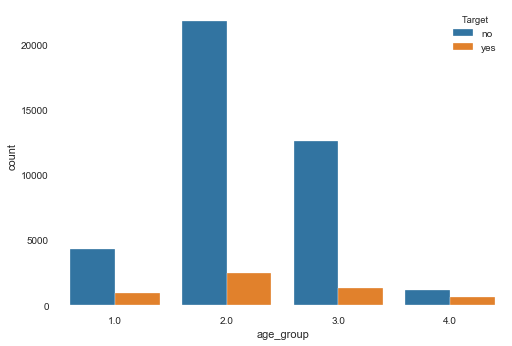

In [24]:
sns.countplot(x='age_group', data=data, hue='Target') 

In [25]:

data.job.value_counts(normalize=True)

blue-collar      0.215257
management       0.209197
technician       0.168034
admin.           0.114375
services         0.091880
retired          0.050076
self-employed    0.034925
entrepreneur     0.032890
unemployed       0.028820
housemaid        0.027427
student          0.020747
unknown          0.006370
Name: job, dtype: float64

Text(0.5, 1.0, 'Count Plot of job for target variable')

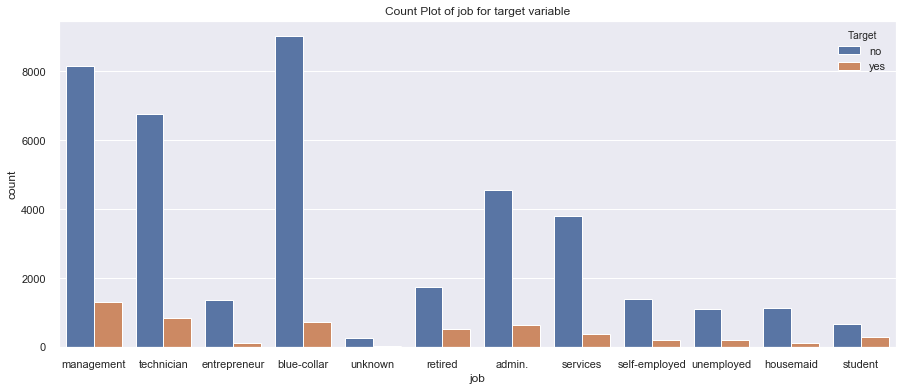

In [26]:
sns.set(rc={'figure.figsize':(15,6)})
sns.countplot(x=data['job'], data=data, hue=data['Target'])
plt.title('Count Plot of job for target variable')

Observation:
Top contacted clients are from job type: 'blue-collar', 'management' & 'technician'


In [27]:

data.marital.value_counts(normalize=True)  

married     0.601933
single      0.282896
divorced    0.115171
Name: marital, dtype: float64

Text(0.5, 1.0, 'Count Plot of marital status for target variable')

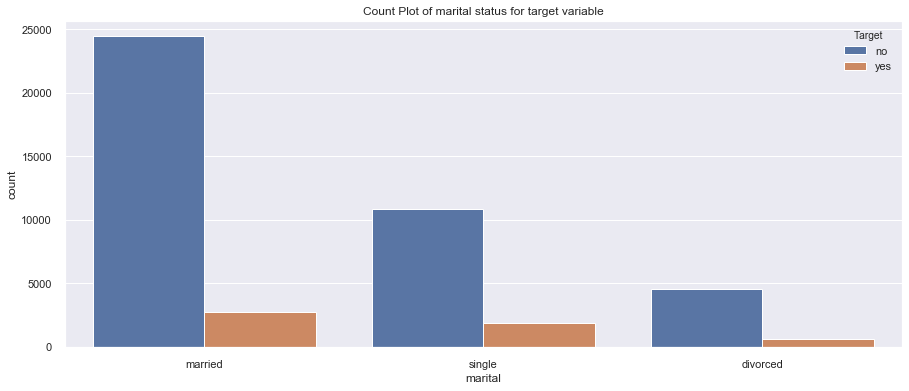

In [28]:
sns.set(rc={'figure.figsize':(15,6)})
sns.countplot(x=data['marital'], data=data, hue=data['Target'])
plt.title('Count Plot of marital status for target variable')


Observation:
Most of the people who are contacted are married.

In [29]:
data.poutcome.value_counts(normalize=True)

unknown    0.817478
failure    0.108403
other      0.040698
success    0.033421
Name: poutcome, dtype: float64

Text(0.5, 1.0, 'Count Plot of poutcome for target variable')

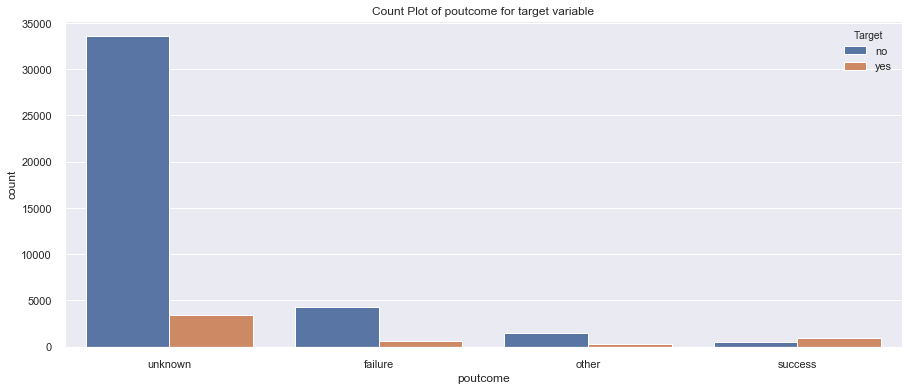

In [30]:
sns.countplot(x=data['poutcome'], data=data, hue=data['Target'])
plt.title('Count Plot of poutcome for target variable')


Observation:
Most of the clients contacted have previous outcome as 'unknown'.

In [31]:
data.education.value_counts(normalize=True)

secondary    0.513194
tertiary     0.294198
primary      0.151534
unknown      0.041074
Name: education, dtype: float64

Text(0.5, 1.0, 'Count Plot of education for target variable')

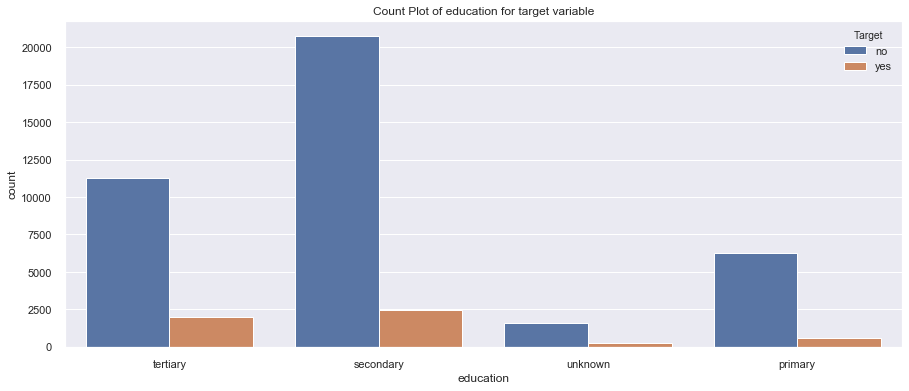

In [32]:
sns.countplot(x=data['education'], data=data, hue=data['Target'])
plt.title('Count Plot of education for target variable')

 Observation:
Most of the people who are contacted have tertiray or secondary education.


In [33]:
data.housing.value_counts(normalize=True)

yes    0.555838
no     0.444162
Name: housing, dtype: float64

Text(0.5, 1.0, 'Count Plot of housing for target variable')

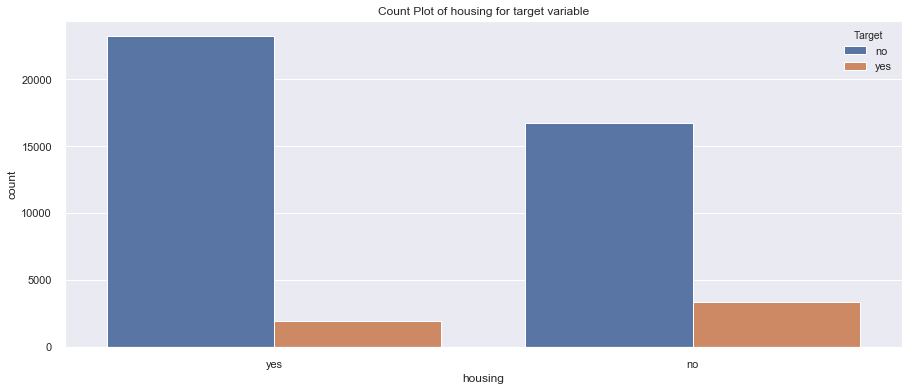

In [34]:
sns.countplot(x=data['housing'], data=data, hue=data['Target'])
plt.title('Count Plot of housing for target variable')

Observation: Most of the people who are contacted have their own houses

In [35]:
data.default.value_counts(normalize=True)

no     0.981973
yes    0.018027
Name: default, dtype: float64

Text(0.5, 1.0, 'Count Plot of default for target variable')

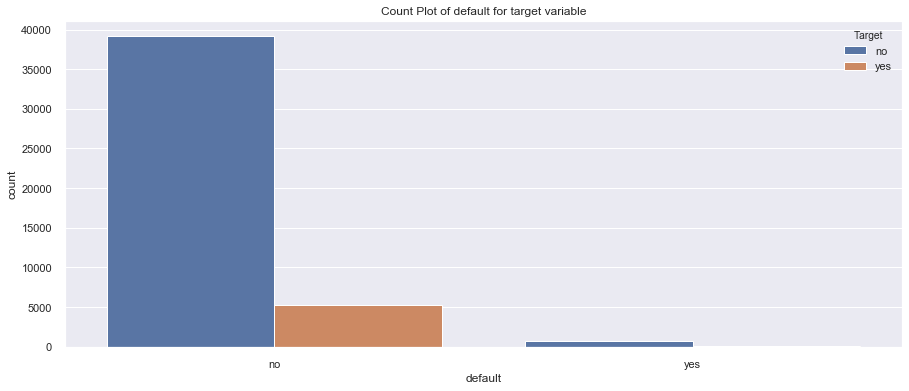

In [36]:
sns.countplot(x=data['default'], data=data, hue=data['Target'])
plt.title('Count Plot of default for target variable')


Observation:
Very few clients are contacted who are defaulter,

In [37]:
data.loan.value_counts(normalize=True)

no     0.839774
yes    0.160226
Name: loan, dtype: float64

Text(0.5, 1.0, 'Count Plot of loan for target variable')

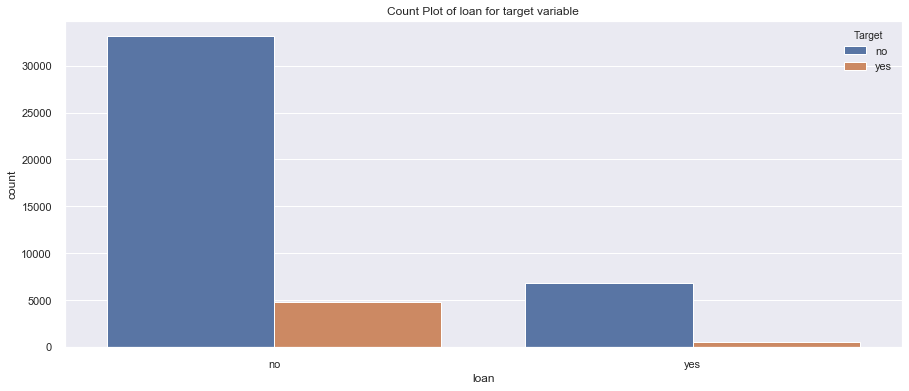

In [38]:
sns.countplot(x=data['loan'], data=data, hue=data['Target'])  
plt.title('Count Plot of loan for target variable')


Observation:
As seen for default variable, less client are contacted who have loan.

In [39]:
data.contact.value_counts(normalize=True)

cellular     0.647741
unknown      0.287983
telephone    0.064276
Name: contact, dtype: float64

Text(0.5, 1.0, 'Count Plot of contact for target variable')

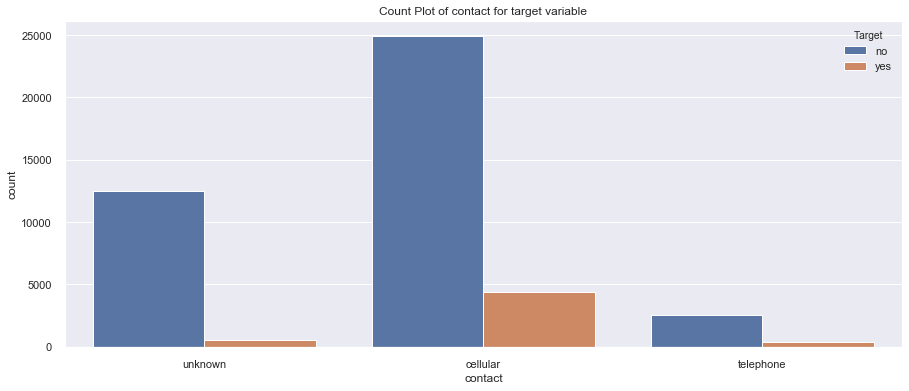

In [40]:
sns.countplot(x=data['contact'], data=data, hue=data['Target'])
plt.title('Count Plot of contact for target variable')

 
Observation:
Most of the people are contacted through cellular

In [41]:
data.month.value_counts(normalize=True)

may    0.304483
jul    0.152507
aug    0.138174
jun    0.118135
nov    0.087810
apr    0.064851
feb    0.058592
jan    0.031032
oct    0.016323
sep    0.012807
mar    0.010551
dec    0.004733
Name: month, dtype: float64

Text(0.5, 1.0, 'Count Plot of month for target variable')

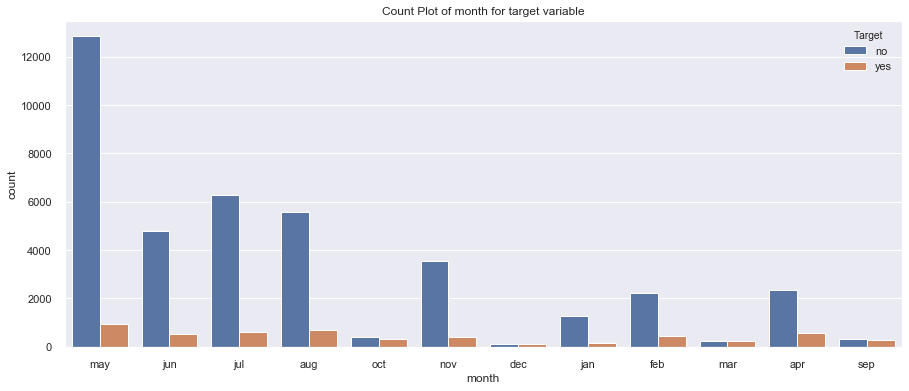

In [42]:
sns.countplot(x=data['month'], data=data, hue=data['Target'])
plt.title('Count Plot of month for target variable')

Most of the clients (approx 1/3 of total) are contacted in the month of May 

In [43]:
data.day.value_counts(normalize=True)

20    0.060870
18    0.051050
21    0.044812
17    0.042888
6     0.042733
5     0.042246
14    0.040875
8     0.040742
28    0.040477
7     0.040189
19    0.038862
29    0.038597
15    0.037668
12    0.035456
13    0.035058
30    0.034638
9     0.034527
11    0.032713
4     0.031961
16    0.031298
2     0.028599
27    0.024795
3     0.023866
26    0.022893
23    0.020769
22    0.020017
25    0.018580
31    0.014222
10    0.011590
24    0.009887
1     0.007122
Name: day, dtype: float64

Text(0.5, 1.0, 'Count Plot of day for target variable')

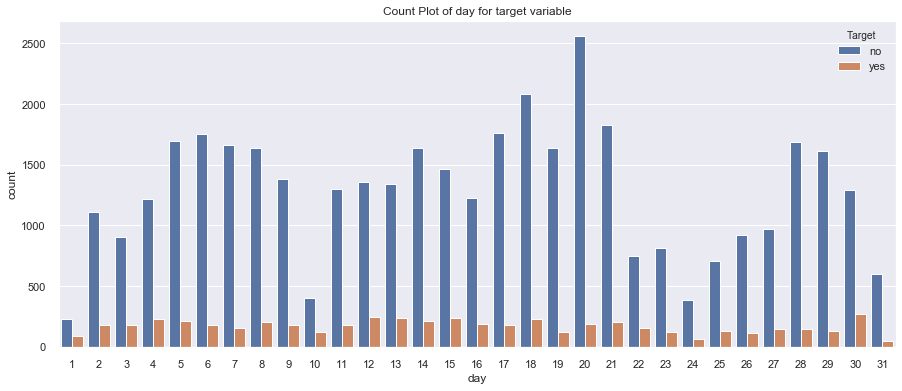

In [44]:
sns.countplot(x=data['day'], data=data, hue=data['Target'])
plt.title('Count Plot of day for target variable')

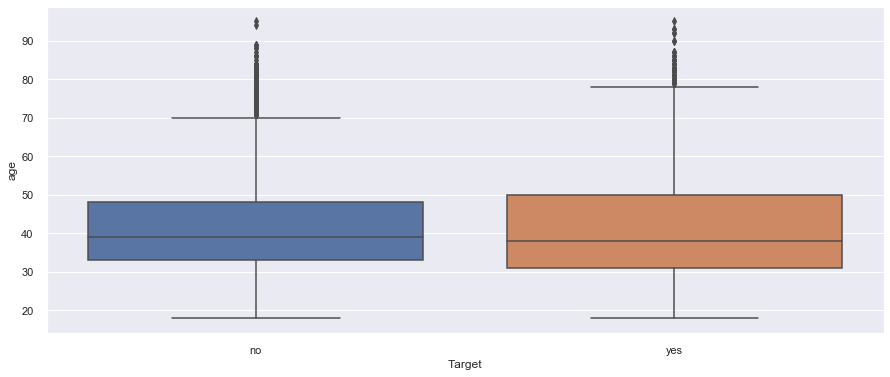

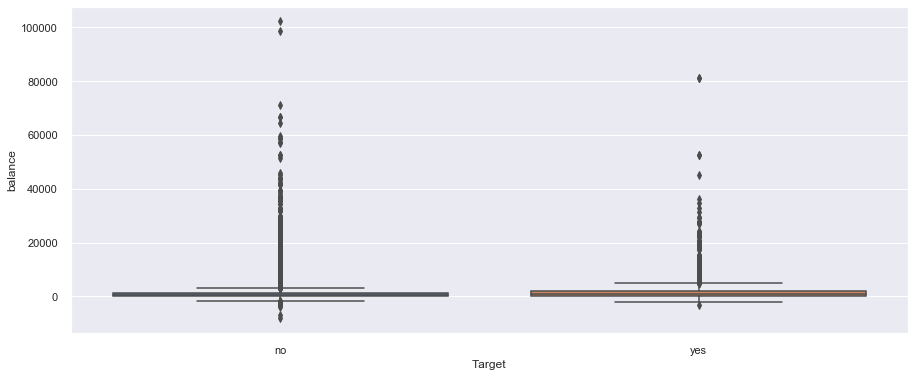

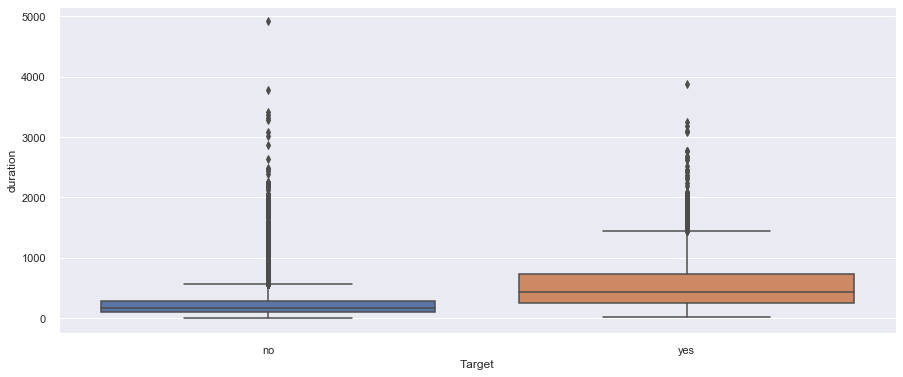

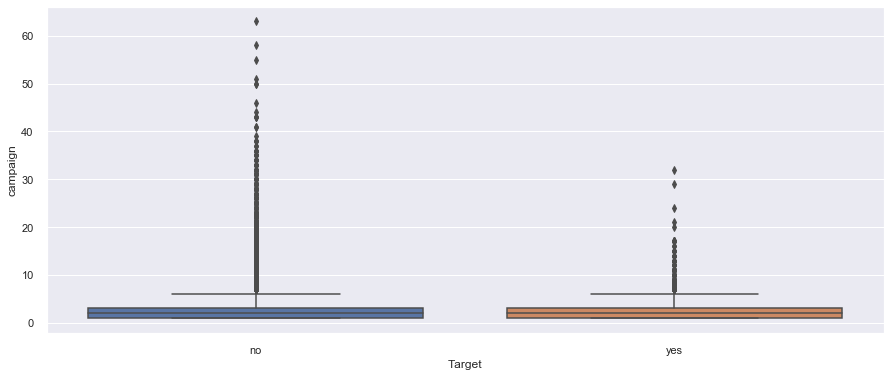

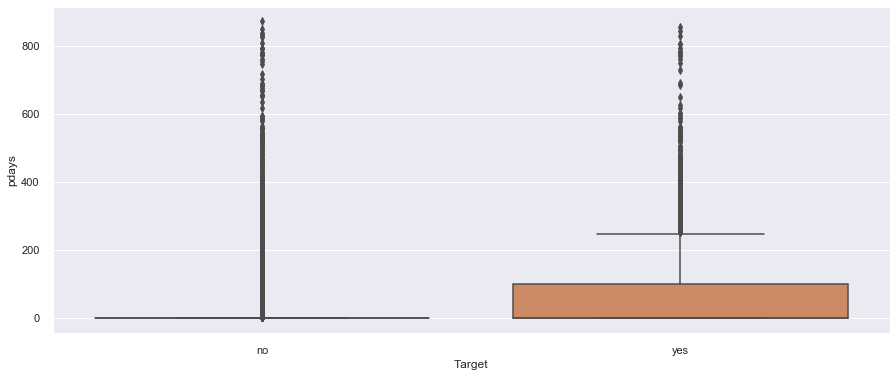

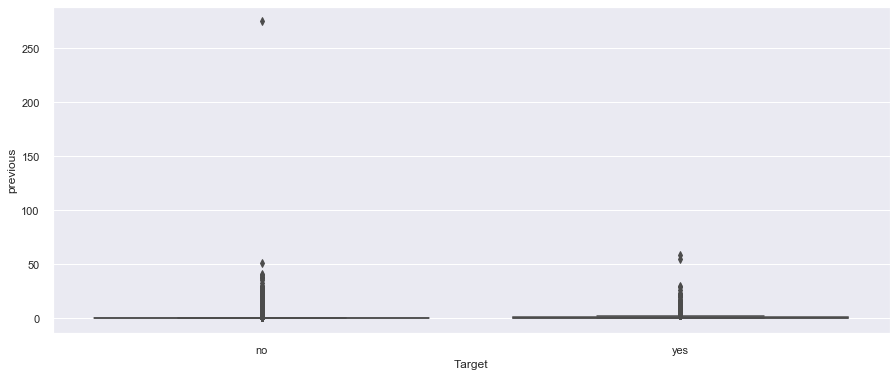

In [45]:
##EXPLORATORY DATA ANALYSIS FOR NUMERICAL VARIABLES-(CHECKING OUTLIERS ALSO)
num_var=["age","balance","duration","campaign","pdays","previous"]
y1=data['Target']

for i in num_var:
    sns.boxplot(x=y1,y=i,data=data)
    plt.show()

OBSERVATION:BALANCE AND DURATION HAVE OUTLIERS

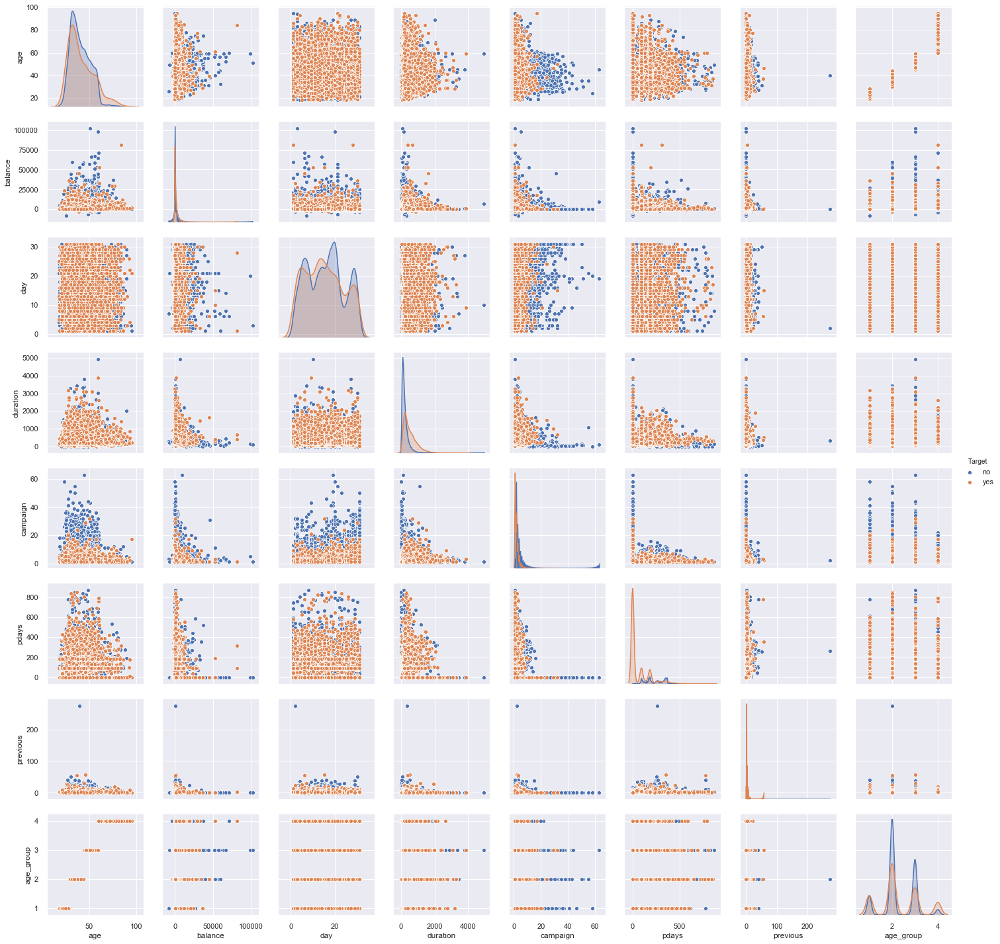

In [46]:

sns.pairplot(data, hue='Target')

# Handling Missing Values

The method is to smartly infer the value of the unknown variable from the other variables. This a way of doing an imputation where we use other independent variables to infer the value of the missing variable. This doesn’t guarantee that all missing values will be addressed but the majority of them will have a reason which can be useful in the prediction.

In [47]:
pd.crosstab(data.job,data.education)

education,primary,secondary,tertiary,unknown
job,,,,
admin.,209,4219,572,171
blue-collar,3758,5371,149,454
entrepreneur,183,542,686,76
housemaid,627,395,173,45
management,294,1121,7801,242
retired,795,984,366,119
self-employed,130,577,833,39
services,345,3457,202,150
student,44,508,223,163


While imputing the values for job and education, we were cognizant of the fact that the correlations should make real-world sense. If it didn’t make real-world sense, we didn’t replace the missing values.

Inferring education from jobs: From the cross-tabulation, it can be seen that people with management jobs usually have a tertiary degree. Hence wherever ‘job’ = management and ‘education’ = unknown, we can replace ‘education’ with ‘tertiary.degree’. Similarly, ‘job’ = ‘services’ → ‘education’ = ‘secondary’ and ‘job’ = ‘housemaid’ → ‘education’ = ‘primary’.

Inferring jobs from education: If ‘education’ = ‘primary’ then the ‘job’ is usually ‘blue-collar’. If ‘education’ = ‘tertiary’, then the ‘job’ = ‘management’.If ‘education’ = ‘secondary’, then the ‘job’ = ‘technician’

Inferring jobs from age: As we see, if ‘age’ > 60, then the ‘job’ is ‘retired,’ which makes sense.

In [48]:
data.loc[(data['age']>60) & (data['job']=='unknown'), 'job']='retired'
data.loc[(data['education'] == 'unknown') & (data['job']=='management'),'education']='tertiary'
data.loc[(data['education'] == 'unknown') & (data['job']=='services'),'education']='secondary'
data.loc[(data['education'] == 'unknown') & (data['job']=='housemaid'),'education']='primary'
data.loc[(data['job'] == 'unknown') & (data['education']=='primary'),'job']='blue-collar'
data.loc[(data['job'] == 'unknown') & (data['education']=='secondary'),'job']='technician'
data.loc[(data['job'] == 'unknown') & (data['education']=='tertiary'),'job']='management'





In [49]:
pd.crosstab(data.job,data.education)

education,primary,secondary,tertiary,unknown
job,,,,
admin.,209,4219,572,171
blue-collar,3808,5371,149,454
entrepreneur,183,542,686,76
housemaid,672,395,173,0
management,294,1121,8077,0
retired,796,989,371,130
self-employed,130,577,833,39
services,345,3607,202,0
student,44,508,223,163


Imputations for house and loan: We are again using cross-tabulation between ‘house’ and ‘job’ and between ‘loan’ and ‘job.’ Our hypothesis is that housing loan status (Yes or No) should be in the proportion of each job category. Hence using the prior known distribution of the housing loan for each job category, the house loan for unknown people will be predicted such that the prior distribution (% House = Yes’s and No’s for each job category remains the same). Similarly, we have filled the missing values in the ‘loan’ variable.

In [50]:
pd.crosstab(data.job,data.housing,normalize='index')

housing,no,yes
job,,
admin.,0.384645,0.615355
blue-collar,0.278777,0.721223
entrepreneur,0.415602,0.584398
housemaid,0.679032,0.320968
management,0.506848,0.493152
retired,0.784777,0.215223
self-employed,0.515516,0.484484
services,0.334136,0.665864
student,0.734542,0.265458


In [51]:
data_dup = data[data.duplicated(keep="last")]#Checking Duplicate Datas
data_dup

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target,age_group


# Percentage of independent variables with Target Variable

In [52]:
pd.crosstab(data.Target,data.pdays,normalize="index")

pdays,-1,1,2,3,4,5,6,7,8,9,...,805,808,826,828,831,838,842,850,854,871
Target,,,,,,,,,,,,,,,,,,,,,
no,0.840890,0.000225,0.000877,0.000025,0.000025,0.000276,0.000225,0.000175,0.000626,0.000225,...,0.000000,0.000025,0.000025,0.000000,0.000025,0.000025,0.000000,0.000025,0.000000,0.000025
yes,0.639818,0.001134,0.000378,0.000000,0.000189,0.000000,0.000189,0.000000,0.000000,0.000567,...,0.000189,0.000000,0.000000,0.000189,0.000000,0.000000,0.000189,0.000000,0.000189,0.000000


In [302]:
pd.crosstab(data.Target,data.age_group,normalize="index")

age_group,1.0,2.0,3.0,4.0
Target,,,,
0,0.108837,0.546516,0.314989,0.029658
1,0.175458,0.464360,0.246739,0.113443


In [303]:
pd.crosstab(data.Target,data.job,normalize="index")

job,admin.,blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown
Target,,,,,,,,,,,,
0,0.113722,0.227218,0.034167,0.028330,0.205075,0.044261,0.034868,0.094810,0.016758,0.170683,0.027579,0.002530
1,0.119304,0.134430,0.023256,0.020609,0.246739,0.098128,0.035356,0.069767,0.050860,0.160522,0.038192,0.002836


In [307]:
pd.crosstab(data.Target,data.month,normalize="index")

month,apr,aug,dec,feb,jan,jul,jun,mar,may,nov,oct,sep
Target,,,,,,,,,,,,
0,0.058990,0.139247,0.002856,0.055308,0.031587,0.157006,0.120109,0.005736,0.321652,0.089349,0.010395,0.007765
1,0.109094,0.130081,0.018907,0.083381,0.026848,0.118548,0.103233,0.046890,0.174891,0.076196,0.061070,0.050860


In [308]:
pd.crosstab(data.Target,data.contact,normalize="index")

contact,cellular,telephone,unknown
Target,,,
0,0.624117,0.063023,0.312860
1,0.826054,0.073738,0.100208


In [309]:
pd.crosstab(data.Target,data.loan,normalize="index")

loan,no,yes
Target,,
0,0.830670,0.169330
1,0.908489,0.091511


In [310]:
pd.crosstab(data.Target,data.default,normalize="index")

default,no,yes
Target,,
0,0.980888,0.019112
1,0.990168,0.009832


In [311]:
pd.crosstab(data.Target,data.marital,normalize="index")

marital,divorced,married,single
Target,,,
0,0.114849,0.612670,0.272481
1,0.117603,0.520892,0.361505


In [312]:
pd.crosstab(data.Target,data.education,normalize="index")

education,primary,secondary,tertiary,unknown
Target,,,,
0,0.157833,0.523095,0.288037,0.031036
1,0.112498,0.466818,0.386462,0.034222


In [313]:
pd.crosstab(data.Target,data.housing,normalize="index")

housing,no,yes
Target,,
0,0.418992,0.581008
1,0.634146,0.365854


In [315]:
pd.crosstab(data.Target,data.poutcome,normalize="index")

poutcome,failure,other,success,unknown
Target,,,,
0,0.107284,0.038400,0.013351,0.840965
1,0.116846,0.058045,0.184912,0.640197


# Inference the following from our EDA:
1. Feature -JOB
Relation with Target variable-The “Blue-Collar are the ones who have said NO to FD while the ones who are “Retired” or working at ”Admin” post comparatively said YES.
2. Feature -EDUCATION
Relation with Target variable-While Comparing we realized that the one holding a “University Degree” are most likely to say YES than others.
3. Feature -Month
Relation with Target variable-In the month of April we have seen large numbers getting converted while in the May maximum turning up to say no. the only Reason we could figure out was in the month of April they had Financial Year End.
campaigns. 
5. Feature- Poutcome
Relation with Target variable- We have received great Response from the people who already had engagements with the bank previously for some other campaigns

6. Feature- Contact
Relation with Target variable- Cellular contact has lead to maximum conversions than the telephonic point of contact.
7. Feature- Default
Relation with Target variable- Non-Defaulters said YES and Defaulters said NO.
8. Feature- Loan
Relation with Target variable- People having personal Loan or Housing Loans didn’t Prefer to join for FD’s.

#Conclusion:
o Target relatively Old Age people.
o Prioritize those customers to who were the part of the previous campaigns.


In [464]:
feature = data.drop(["Target","age"],axis=1)
target = data["Target"]

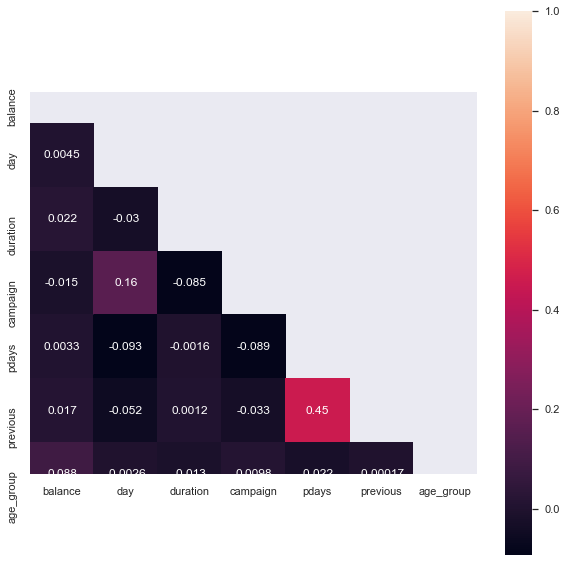

In [465]:

corr = feature.corr()

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(10, 10))
sns.heatmap(corr, mask=mask,annot=True,square=True)

Text(0.5, 1.05, 'Pearson correlation of Features')

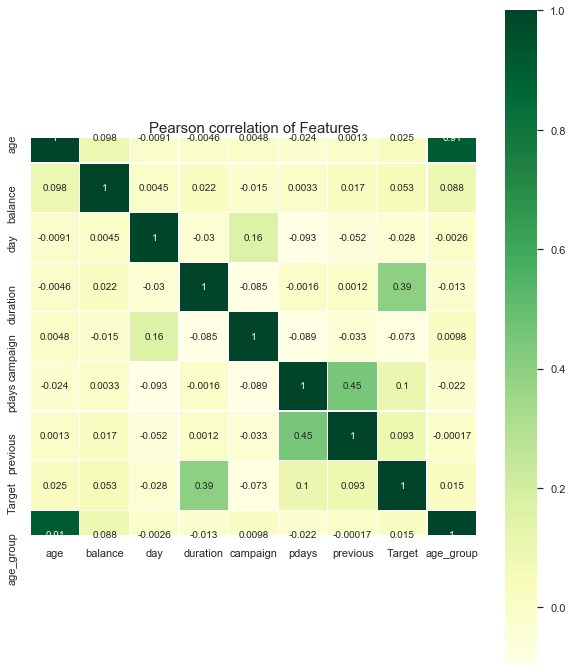

In [466]:
# Idea of correlation matrix of numerical feature:
%matplotlib inline
corr = data.corr()

f, ax = plt.subplots(figsize=(10,12))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

_ = sns.heatmap(corr, cmap="YlGn", square=True, ax=ax, annot=True, linewidth=0.1)

plt.title("Pearson correlation of Features", y=1.05, size=15)


From the above heatmap we can see that there are some numerical features which share a high correlation between them.

# Outlier detection for numerical attributes using IQR

In [53]:
numerical=['age','balance','day','campaign','duration','pdays','previous']

In [54]:
# converting call duration from seconds to minute
data['duration'] = data['duration']/60


In [55]:
# creating new data frame of numerical columns 
data_numerical = data[numerical]
print('Shape of numerical dataframe {}'.format(data_numerical.shape))
data_numerical.head()

Shape of numerical dataframe (45211, 7)


,age,balance,day,campaign,duration,pdays,previous
0,58,2143,5,1,4.350000,-1,0
1,44,29,5,1,2.516667,-1,0
2,33,2,5,1,1.266667,-1,0
3,47,1506,5,1,1.533333,-1,0
4,33,1,5,1,3.300000,-1,0


In [56]:
q3 = data_numerical.quantile(0.75)
q1 = data_numerical.quantile(0.25)
iqr = q3 - q1
print('IQR for numerical attributes')
print(iqr)

IQR for numerical attributes
age           15.0
balance     1356.0
day           13.0
campaign       2.0
duration       3.6
pdays          0.0
previous       0.0
dtype: float64


In [57]:
data_out = data[~((data_numerical < (q1 - 1.5 * iqr)) |(data_numerical > (q3 + 1.5 * iqr))).any(axis=1)]
print('{} points are outliers based on IQR'.format(data.shape[0] - data_out.shape[0]))

17029 points are outliers based on IQR


But we also see that the value of these outliers are not so unrealistic . Hence, we need not remove them since the prediction model should represent the real world. This improves the generalizability of the model and makes it robust for real world situations. The outliers, therefore, are not removed.

## Removing "Duration" feature¶
Duration of a call is a strong predictor, it will also be known after the call has been made, so no way of using this as a predictor practically.
Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model

In [58]:
data['pdays'].replace({-1 :0},inplace=True) 
data['Target'].replace({"yes" :1},inplace=True)
data['Target'].replace({"no" :0},inplace=True)

In [59]:
# Convert the columns into categorical variables
data1 = data.copy()
data1['job'] = data1['job'].astype('category').cat.codes
data1['marital'] = data1['marital'].astype('category').cat.codes
data1['education'] = data1['education'].astype('category').cat.codes
data1['contact'] = data1['contact'].astype('category').cat.codes
data1['poutcome'] = data1['poutcome'].astype('category').cat.codes
data1['month'] = data1['month'].astype('category').cat.codes 
data1['default'] = data1['default'].astype('category').cat.codes
data1['loan'] = data1['loan'].astype('category').cat.codes
data1['housing'] = data1['housing'].astype('category').cat.codes

In [293]:
data1.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target,age_group
0,58,4,1,2,0,2143,1,0,2,5,8,4.350000,1,0,0,3,0,3.0
1,44,9,2,1,0,29,1,0,2,5,8,2.516667,1,0,0,3,0,2.0
2,33,2,1,1,0,2,1,1,2,5,8,1.266667,1,0,0,3,0,2.0
3,47,1,1,3,0,1506,1,0,2,5,8,1.533333,1,0,0,3,0,3.0
4,33,11,2,3,0,1,0,0,2,5,8,3.300000,1,0,0,3,0,2.0


In [61]:
data1.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'Target', 'age_group'],
      dtype='object')

In [63]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 18 columns):
age          45211 non-null int64
job          45211 non-null int8
marital      45211 non-null int8
education    45211 non-null int8
default      45211 non-null int8
balance      45211 non-null int64
housing      45211 non-null int8
loan         45211 non-null int8
contact      45211 non-null int8
day          45211 non-null int64
month        45211 non-null int8
duration     45211 non-null float64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null int8
Target       45211 non-null int64
age_group    45211 non-null float64
dtypes: float64(2), int64(7), int8(9)
memory usage: 3.5 MB


In [64]:
X=data1.drop(['age_group','duration','Target'],axis=1)#Creating catergorical features for age and balance
y=data1['Target']

In [65]:
y.value_counts(normalize=True) #Huge Class Imbalance

0    0.883015
1    0.116985
Name: Target, dtype: float64

# Huge Class Imbalance 
We will use SMOTE ANALYSIS. SMOTE only attacks the minority class

In [66]:
from imblearn.over_sampling import SMOTE    

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 25)

In [68]:
print("Before UpSampling, counts of label '1': {}".format(sum(y_train==1)))
print("Before UpSampling, counts of label '0': {} \n".format(sum(y_train==0)))

Before UpSampling, counts of label '1': 3715
Before UpSampling, counts of label '0': 27932 



In [69]:
sm = SMOTE(sampling_strategy = 1 ,k_neighbors = 20, random_state=42)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train.ravel())
sc = StandardScaler()



In [70]:
X_train1 = sc.fit_transform(X_train_res)#Scaling the X varaibles in the dataset
X_test1 = sc.transform(X_test)

In [71]:

print("After UpSampling, counts of label '1': {}".format(sum(y_train_res==1)))
print("After UpSampling, counts of label '0': {} \n".format(sum(y_train_res==0)))



print('After UpSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After UpSampling, the shape of train_y: {} \n'.format(y_train_res.shape))

After UpSampling, counts of label '1': 27932
After UpSampling, counts of label '0': 27932 

After UpSampling, the shape of train_X: (55864, 15)
After UpSampling, the shape of train_y: (55864,) 



# Classifiers : 
## Based on the values of different parameters we can conclude to the following classifiers for Binary Classification.
Logistics Regression,
K Nearest Neighbour,
Support Vector Machines,
Naive Bayes,
Decesion Tree,
Gradient Boosting,
AdaBoosting,
Random Forest Classifier,
Bagging ,
Xgboost,
Gradient Bosting

And performance metric using precision and recall calculation along with roc_auc_score & accuracy_score

# CALCULATING MODELS WITHOUT REMOVING UNIMPORTANT FEATURES AND ALSO WITH REMOVING UNIMPIORTANT FEATURE

### 1. WITHOUT REMOVING UNIMPORTANT FEATURES

# LOGISTIC REGRESSION

In [72]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()

In [73]:
model.fit(X_train1,y_train_res) ## This is called model training or model learning.

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [74]:
from sklearn.metrics import log_loss
# dictionary to store accuracy and roc score for each model
score = {}

In [75]:
from sklearn.metrics import log_loss 
# dictionary to store accuracy and roc score for each model
score = {}

model = LogisticRegression()
model.fit(X_train1, y_train_res)
y_probs_train = model.predict_proba(X_train1)
y_probs_test = model.predict_proba(X_test1)
y_predicted_train = model.predict(X_train1)
y_predicted_test = model.predict(X_test1) 

# keep probabilities for the positive outcome only
y_probs_train = y_probs_train[:, 1] 
y_probs_test = y_probs_test[:, 1]
 
# calculate AUC and Accuracy
train_auc = roc_auc_score(y_train_res, y_probs_train)
test_auc = roc_auc_score(y_test, y_probs_test)
train_acc = accuracy_score(y_train_res, y_predicted_train)
test_acc = accuracy_score(y_test, y_predicted_test) 
print('*'*50)
print('Train AUC: %.3f' % train_auc)
print('Test AUC: %.3f' % test_auc)
print('*'*50)
print('Train Accuracy: %.3f' % train_acc)
print('Test Accuracy: %.3f' % test_acc)

score['Logistic Regression'] = [test_auc, test_acc]  

parameters = model.coef_# printing the coefficents of different parameters
print(parameters)
intercept=model.intercept_
print(intercept)





**************************************************
Train AUC: 0.843
Test AUC: 0.685
**************************************************
Train Accuracy: 0.766
Test Accuracy: 0.704
[[-0.31826402 -0.09768628 -0.38525296 -0.29237725 -0.18503633  0.08818872
  -0.88593722 -0.59072869 -0.72657323 -0.11624654  0.08289101 -0.59725042
   0.16757486  0.12232544  0.06589932]]
[-0.1666329]


In [76]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import roc_curve,auc

In [77]:
print(classification_report(y_test,y_predicted_test))   

              precision    recall  f1-score   support

           0       0.93      0.72      0.81     11990
           1       0.21      0.56      0.31      1574

    accuracy                           0.70     13564
   macro avg       0.57      0.64      0.56     13564
weighted avg       0.84      0.70      0.75     13564



In [78]:
from sklearn.metrics import plot_confusion_matrix

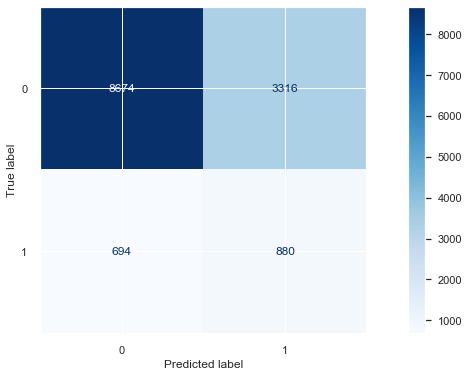

In [79]:
from sklearn.metrics import plot_confusion_matrix
disp=plot_confusion_matrix(model,X_test1,y_test,cmap='Blues',values_format='3')

In [80]:
disp.confusion_matrix

array([[8674, 3316],
       [ 694,  880]])

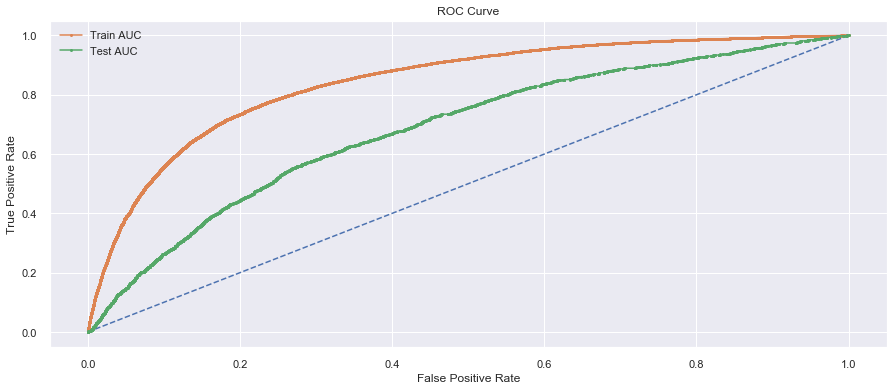

In [81]:
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train_res, y_probs_train)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_probs_test)
plt.plot([0, 1], [0, 1], linestyle='--') 
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr, marker='.', label='Train AUC')  
plt.plot(test_fpr, test_tpr, marker='.', label='Test AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.show()

In [82]:
# Calculating FPR,TPR,THRESHOLD FOR KNN CLASSIFICATION
i = np.arange(len(test_tpr)) # index for df 
roc_df = pd.DataFrame({'test_fpr' : pd.Series(test_fpr, index=i),'test_tpr' : pd.Series(test_tpr, index = i),  'test_thresholds' : pd.Series(test_thresholds, index = i)})

In [83]:
roc_df

,test_fpr,test_tpr,test_thresholds
0,0.000000,0.000000,1.963303e+00
1,0.000083,0.000000,9.633031e-01
2,0.000584,0.000000,9.547671e-01
3,0.000584,0.000635,9.388871e-01
4,0.000667,0.000635,9.381471e-01
...,...,...,...
2646,0.996747,0.998729,4.205068e-04
2647,0.996747,0.999365,4.139870e-04
2648,0.998415,0.999365,9.617049e-05
2649,0.998415,1.000000,9.307127e-05


# DOING GRIDSEARCH FOR MODEL TUNING-LOGISTIC REGRESSION

In [84]:
from sklearn.model_selection import GridSearchCV

In [85]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
grid={"C":[(5**i)*x for i in range(2,7) for x in [1,3,5]], "penalty":["l1","l2"],"max_iter":[100,500,600],"solver" : ["liblinear"]}# l1 lasso l2 ridge
logreg=LogisticRegression()  
logreg_cv=GridSearchCV(logreg,grid,cv=10,verbose=True,n_jobs=-1,scoring='accuracy')
logreg_cv.fit(X_train1,y_train_res) 
print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_) 
print("accuracy :",logreg_cv.best_score_) 

Fitting 10 folds for each of 90 candidates, totalling 900 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   20.0s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:   42.6s
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  1.2min


tuned hpyerparameters :(best parameters)  {'C': 25, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}
accuracy : 0.7653073977228735


[Parallel(n_jobs=-1)]: Done 900 out of 900 | elapsed:  1.4min finished


In [86]:
model1 = LogisticRegression(C=25,penalty="l2",solver="liblinear",random_state=25)
model1.fit(X_train1, y_train_res)
y_probs_train1 = model1.predict_proba(X_train1)
y_probs_test1 = model1.predict_proba(X_test1)
y_predicted_train1 = model1.predict(X_train1)
y_predicted_test1 = model1.predict(X_test1)
 
# keep probabilities for the positive outcome only
y_probs_train1 = y_probs_train1[:, 1]
y_probs_test1 = y_probs_test1[:, 1]
 
# calculate AUC and Accuracy after GRIDSEARCH
train_auc1 = roc_auc_score(y_train_res, y_probs_train1)
test_auc1 = roc_auc_score(y_test, y_probs_test1)
train_acc1 = accuracy_score(y_train_res, y_predicted_train1)  
test_acc1 = accuracy_score(y_test, y_predicted_test1)
print('*'*50)
print('Train AUC: %.3f' % train_auc1)
print('Test AUC: %.3f' % test_auc1)
print('*'*50)
print('Train Accuracy: %.3f' % train_acc1)
print('Test Accuracy: %.3f' % test_acc1)

score['Logistic Regression'] = [test_auc1, test_acc1]  

parameters = model1.coef_# printing the coefficents of different parameters after GRIDSEARCH
print(parameters)
intercept=model1.intercept_
print(intercept)



**************************************************
Train AUC: 0.843
Test AUC: 0.685
**************************************************
Train Accuracy: 0.766
Test Accuracy: 0.704
[[-0.31834894 -0.0977035  -0.38534383 -0.29242662 -0.18506125  0.0881897
  -0.88608418 -0.5908688  -0.7267228  -0.11625908  0.0829419  -0.59738702
   0.16759773  0.12235382  0.06593782]]
[-0.16668417]


In [87]:
print(classification_report(y_test,y_predicted_test1))#AFTER GRIDSEARCH

              precision    recall  f1-score   support

           0       0.93      0.72      0.81     11990
           1       0.21      0.56      0.31      1574

    accuracy                           0.70     13564
   macro avg       0.57      0.64      0.56     13564
weighted avg       0.84      0.70      0.75     13564



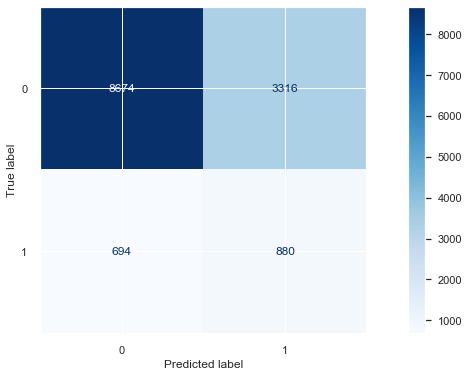

In [88]:
from sklearn.metrics import plot_confusion_matrix #AFTER GRIDSEARCH
disp=plot_confusion_matrix(model1,X_test1,y_test ,cmap='Blues',values_format='3')

In [89]:
disp.confusion_matrix

array([[8674, 3316],
       [ 694,  880]])

## ANALYSIS OF CONFUSION MATRIX-AFTER GRIDSEARCH
TRUE POSITIVE(TP): The model correctly predicted that 880 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 8674 people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 3316 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 694 people will not take term deposit, but they did took term deposit    

 
### NO SIGNIFICANT DIFFERENENCE WHILE DOING GRIDSEARCH CV FOR LOGISTIC REGRESSION

# K NEIGHBOURS CLASSIFIER

In [90]:
from sklearn import model_selection
from sklearn.neighbors import KNeighborsClassifier

In [91]:
knn= KNeighborsClassifier(n_neighbors= 23)# TAKING N_NEIGHBORS RANDOMLY AS 23

In [92]:
knn.fit(X_train1, y_train_res) # Model fitting on training Data
y_probs_train_knn = knn.predict_proba(X_train1)
y_probs_test_knn = knn.predict_proba(X_test1)
y_predicted_train_knn = knn.predict(X_train1)
y_predicted_test_knn = knn.predict(X_test1)

# keep probabilities for the positive outcome only
y_probs_train_knn = y_probs_train_knn[:, 1]
y_probs_test_knn = y_probs_test_knn[:, 1]
 
# calculate AUC and Accuracy
train_auc_knn = roc_auc_score(y_train_res, y_probs_train_knn)
test_auc_knn = roc_auc_score(y_test, y_probs_test_knn)
train_acc_knn = accuracy_score(y_train_res, y_predicted_train_knn)
test_acc_knn = accuracy_score(y_test, y_predicted_test_knn)   
print('*'*50)
print('Train AUC: %.3f' % train_auc_knn)
print('Test AUC: %.3f' % test_auc_knn)
print('*'*50)
print('Train Accuracy: %.3f' % train_acc_knn)
print('Test Accuracy: %.3f' % test_acc_knn)

score['KNN'] = [test_auc_knn, test_acc_knn]   



**************************************************
Train AUC: 0.918
Test AUC: 0.720
**************************************************
Train Accuracy: 0.835
Test Accuracy: 0.780


In [93]:
print(classification_report(y_test,y_predicted_test_knn))  

              precision    recall  f1-score   support

           0       0.93      0.82      0.87     11990
           1       0.26      0.50      0.35      1574

    accuracy                           0.78     13564
   macro avg       0.60      0.66      0.61     13564
weighted avg       0.85      0.78      0.81     13564



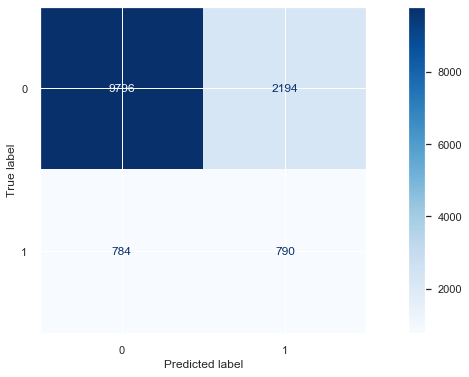

In [94]:
from sklearn.metrics import plot_confusion_matrix
disp1=plot_confusion_matrix(knn,X_test1,y_test,cmap='Blues',values_format='3')

In [95]:
disp1.confusion_matrix

array([[9796, 2194],
       [ 784,  790]])

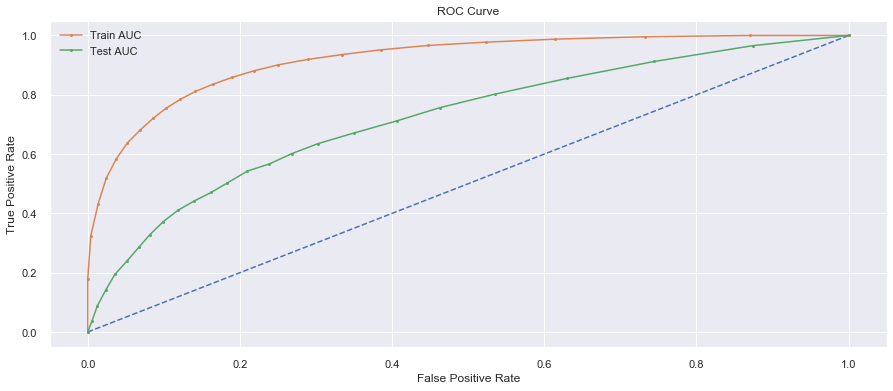

In [96]:
# calculate roc curve
train_fpr_knn, train_tpr_knn, train_thresholds_knn = roc_curve(y_train_res, y_probs_train_knn)
test_fpr_knn, test_tpr_knn, test_thresholds_knn = roc_curve(y_test, y_probs_test_knn)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr_knn, train_tpr_knn, marker='.', label='Train AUC')
plt.plot(test_fpr_knn, test_tpr_knn, marker='.', label='Test AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.show()

# GRIDSEARCH FOR KNN

In [97]:
#USING GRIDSEARCH CV TO TUNE THE PARAMETERS
grid_params={'n_neighbors':[15,17,13],'metric':["euclidean",'cityblock'],'weights':["uniform","distance"]}
knn_classifier=KNeighborsClassifier(algorithm='brute')

In [98]:
gs_knn=GridSearchCV(knn_classifier,grid_params,verbose=1,cv=5,n_jobs=-1)

In [99]:
gs_knn.fit(X_train1,y_train_res)
print(" Training score",gs_knn.score(X_train1,y_train_res))
print(gs_knn.best_params_)
print(gs_knn.best_estimator_)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  7.5min finished


 Training score 1.0
{'metric': 'cityblock', 'n_neighbors': 13, 'weights': 'distance'}
KNeighborsClassifier(algorithm='brute', leaf_size=30, metric='cityblock',
                     metric_params=None, n_jobs=None, n_neighbors=13, p=2,
                     weights='distance')


In [100]:
gs_knn_pred=gs_knn.predict(X_test1)
accuracy=accuracy_score(y_test,gs_knn_pred)
print(accuracy)

0.8152462400471837


In [101]:
knn1= KNeighborsClassifier(n_neighbors=13, weights = 'distance', metric = 'cityblock',p =2,algorithm='brute',leaf_size=30) 
knn1.fit(X_train1, y_train_res)
y_probs_train_knn1 = knn1.predict_proba(X_train1)
y_probs_test_knn1 = knn1.predict_proba(X_test1)
y_predicted_train_knn1 = knn1.predict(X_train1)
y_predicted_test_knn1 = knn1.predict(X_test1)

# keep probabilities for the positive outcome only AFTER GRIDSEARCH
y_probs_train_knn1 = y_probs_train_knn1[:, 1]
y_probs_test_knn1 = y_probs_test_knn1[:, 1]
 
# calculate AUC and Accuracy AFTER GRIDSEARCH
train_auc_knn1 = roc_auc_score(y_train_res, y_probs_train_knn1)
test_auc_knn1 = roc_auc_score(y_test, y_probs_test_knn1)
train_acc_knn1 = accuracy_score(y_train_res, y_predicted_train_knn1)
test_acc_knn1 = accuracy_score(y_test, y_predicted_test_knn1)
print('*'*50)
print('Train AUC: %.3f' % train_auc_knn1)
print('Test AUC: %.3f' % test_auc_knn1) 
print('*'*50)
print('Train Accuracy: %.3f' % train_acc_knn1)
print('Test Accuracy: %.3f' % test_acc_knn1)

score['KNN1'] = [test_auc_knn1, test_acc_knn1]  



**************************************************
Train AUC: 1.000
Test AUC: 0.733
**************************************************
Train Accuracy: 1.000
Test Accuracy: 0.815


In [103]:
print(classification_report(y_test,y_predicted_test_knn1)) #AFTER GRIDSEARCH

              precision    recall  f1-score   support

           0       0.93      0.86      0.89     11990
           1       0.31      0.49      0.38      1574

    accuracy                           0.82     13564
   macro avg       0.62      0.67      0.64     13564
weighted avg       0.86      0.82      0.83     13564



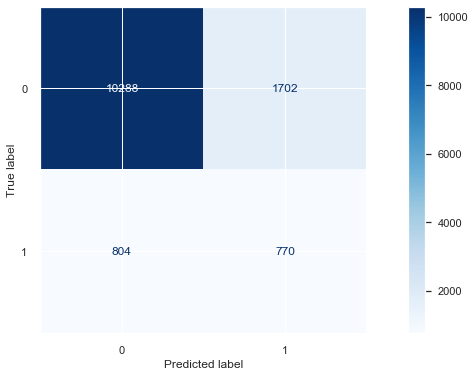

In [104]:
disp2=plot_confusion_matrix(knn1,X_test1,y_test,cmap='Blues',values_format='3')#AFTER GRIDSEARCH

In [105]:
disp2.confusion_matrix #AFTER GRIDSEARCH

array([[10288,  1702],
       [  804,   770]])

## ANALYSIS OF CONFUSION MATRIX KNN -AFTER GRIDSEARCH

TRUE POSITIVE(TP): The model correctly predicted that 770 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 10288 people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 1702 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 804 people will not take term deposit, but they did took term deposit 

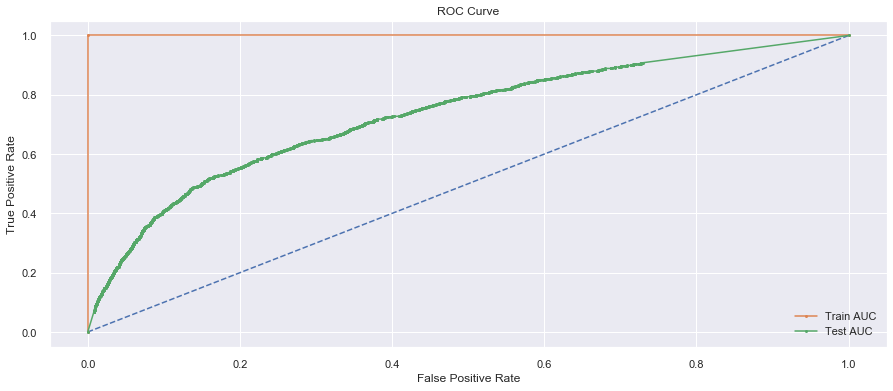

In [106]:
# calculate roc curve after GRIDSEARCH
train_fpr_knn1, train_tpr_knn1, train_thresholds_knn1 = roc_curve(y_train_res, y_probs_train_knn1)
test_fpr_knn1, test_tpr_knn1, test_thresholds_knn1 = roc_curve(y_test, y_probs_test_knn1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model AFTER GRIDSEARCH 
plt.plot(train_fpr_knn1, train_tpr_knn1, marker='.', label='Train AUC')
plt.plot(test_fpr_knn1, test_tpr_knn1, marker='.', label='Test AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.show()

# NAIVE BAYES

In [107]:
from sklearn.naive_bayes import GaussianNB

In [108]:
from sklearn.naive_bayes import GaussianNB

nb = GaussianNB()
nb.fit(X_train1, y_train_res)
y_probs_train_nb = nb.predict_proba(X_train1)
y_probs_test_nb = nb.predict_proba(X_test1) 
y_predicted_train_nb = nb.predict(X_train1)
y_predicted_test_nb = nb.predict(X_test1)

# keep probabilities for the positive outcome only
y_probs_train_nb = y_probs_train_nb[:, 1]
y_probs_test_nb = y_probs_test_nb[:, 1]
 
# calculate AUC and Accuracy
train_auc_nb = roc_auc_score(y_train_res, y_probs_train_nb)
test_auc_nb = roc_auc_score(y_test, y_probs_test_nb)
train_acc_nb = accuracy_score(y_train_res, y_predicted_train_nb)
test_acc_nb = accuracy_score(y_test, y_predicted_test_nb)
print('*'*50)
print('Train AUC: %.3f' % train_auc_nb)
print('Test AUC: %.3f' % test_auc_nb)
print('*'*50) 
print('Train Accuracy: %.3f' % train_acc_nb)
print('Test Accuracy: %.3f' % test_acc_nb)

score['NAIVE BAYES'] = [test_auc_nb, test_acc_nb]  



**************************************************
Train AUC: 0.815
Test AUC: 0.686
**************************************************
Train Accuracy: 0.714
Test Accuracy: 0.543


In [437]:
print(classification_report(y_test,y_predicted_test_nb))  

              precision    recall  f1-score   support

           0       0.95      0.51      0.66     11990
           1       0.17      0.78      0.29      1574

    accuracy                           0.54     13564
   macro avg       0.56      0.65      0.47     13564
weighted avg       0.86      0.54      0.62     13564



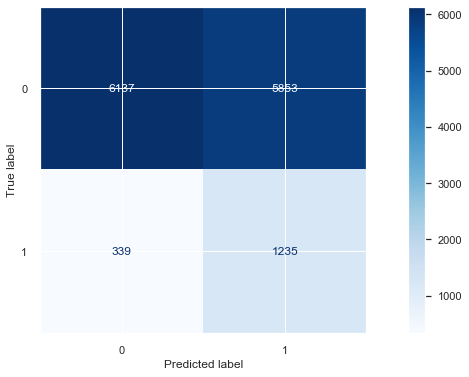

In [110]:
disp3=plot_confusion_matrix(nb,X_test1,y_test,cmap='Blues',values_format='3')

In [111]:
disp3.confusion_matrix

array([[6137, 5853],
       [ 339, 1235]])

## ANALYSIS OF CONFUSION MATRIX -AFTER GRIDSEARCH NAIVE BAYES

TRUE POSITIVE(TP): The model correctly predicted that 1235 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 6137 people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 5853 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 339 people will not take term deposit, but they did took term deposit 

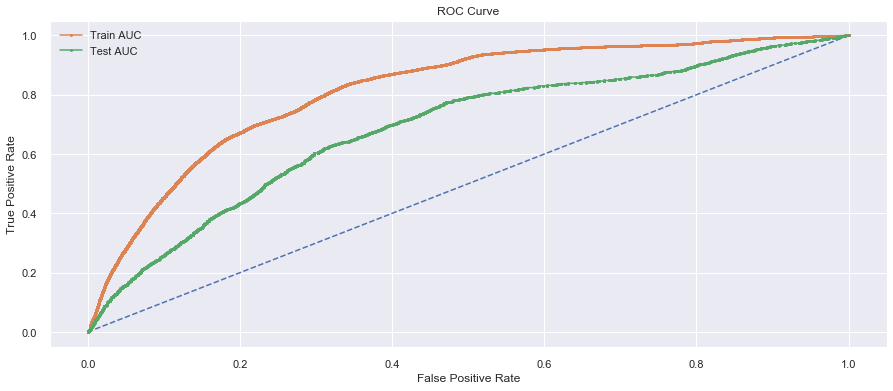

In [112]:
# calculate roc curve
train_fpr_nb, train_tpr_nb, train_thresholds_nb = roc_curve(y_train_res, y_probs_train_nb)
test_fpr_nb, test_tpr_nb, test_thresholds_nb = roc_curve(y_test, y_probs_test_nb)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr_nb, train_tpr_nb, marker='.', label='Train AUC')
plt.plot(test_fpr_nb, test_tpr_nb, marker='.', label='Test AUC')  
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.show()

# SVM

In [113]:

from sklearn.svm import SVC 

In [114]:
# Building a Support Vector Machine on train data
svc_model_linear = SVC(kernel='linear',probability=True )
svc_model_linear.fit(X_train1, y_train_res)
  
prediction = svc_model_linear.predict(X_test1) 
# check the accuracy on the training set
print(svc_model_linear.score(X_train1, y_train_res))
print(svc_model_linear.score(X_test1, y_test))

0.7657167406558786
0.7238277794161014


In [115]:
svc_model_rbf = SVC(kernel='rbf',probability=True)
svc_model_rbf.fit(X_train1, y_train_res)

prediction2 = svc_model_rbf.predict(X_test1)
# check the accuracy on the training set
print(svc_model_rbf.score(X_train1, y_train_res))
print(svc_model_rbf.score(X_test1, y_test))

0.8277423743376772
0.7762459451489236


In [116]:
svc_model_poly = SVC(kernel='poly',probability=True)
svc_model_poly.fit(X_train1, y_train_res) 

prediction3 = svc_model_poly.predict(X_test1)
# check the accuracy on the training set
print(svc_model_poly.score(X_train1, y_train_res))
print(svc_model_poly.score(X_test1, y_test))

0.7969533151940427
0.7273665585373046


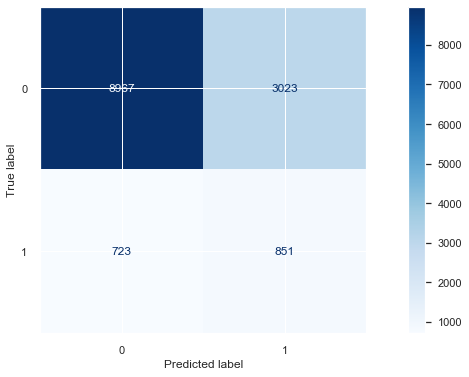

In [117]:
from sklearn.metrics import plot_confusion_matrix # KERNEL LINEAR
disp4=plot_confusion_matrix(svc_model_linear,X_test1,y_test,cmap='Blues',values_format='3')

In [118]:
disp4.confusion_matrix #KERNEL LINEAR

array([[8967, 3023],
       [ 723,  851]])

In [119]:
print(classification_report(y_test,prediction))  #KERNEL LINEAR

              precision    recall  f1-score   support

           0       0.93      0.75      0.83     11990
           1       0.22      0.54      0.31      1574

    accuracy                           0.72     13564
   macro avg       0.57      0.64      0.57     13564
weighted avg       0.84      0.72      0.77     13564



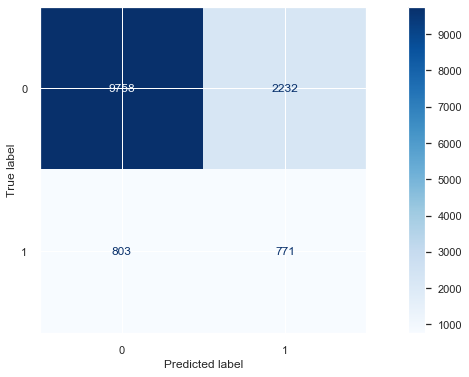

In [120]:
disp5=plot_confusion_matrix(svc_model_rbf,X_test1,y_test,cmap='Blues',values_format='3')#KERNEL RBF

In [121]:
disp5.confusion_matrix ##KERNEL RBF

array([[9758, 2232],
       [ 803,  771]])

In [122]:
print(classification_report(y_test,prediction2))  #KERNEL RBF

              precision    recall  f1-score   support

           0       0.92      0.81      0.87     11990
           1       0.26      0.49      0.34      1574

    accuracy                           0.78     13564
   macro avg       0.59      0.65      0.60     13564
weighted avg       0.85      0.78      0.80     13564



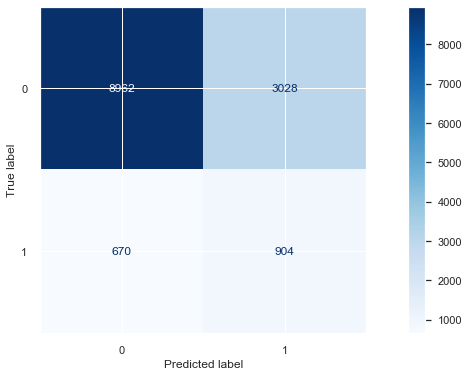

In [123]:
disp6=plot_confusion_matrix(svc_model_poly,X_test1,y_test,cmap='Blues',values_format='3') ##KERNEL POLY

In [124]:
disp6.confusion_matrix##KERNEL POLY

array([[8962, 3028],
       [ 670,  904]])

In [125]:
print(classification_report(y_test,prediction3))  ##KERNEL POLY

              precision    recall  f1-score   support

           0       0.93      0.75      0.83     11990
           1       0.23      0.57      0.33      1574

    accuracy                           0.73     13564
   macro avg       0.58      0.66      0.58     13564
weighted avg       0.85      0.73      0.77     13564



In [127]:
ylog_proba=svc_model_linear.predict_proba(X_test1) ##KERNEL LINEAR
fpr,tpr,threshold=roc_curve(y_test,ylog_proba[:,1])### Lets get the probabilit score for the class 1( we can get for 0 as well)  
roc_auc=auc(fpr,tpr)   
print("Area under the Roc Curve : %f" % roc_auc)



Area under the Roc Curve : 0.684843


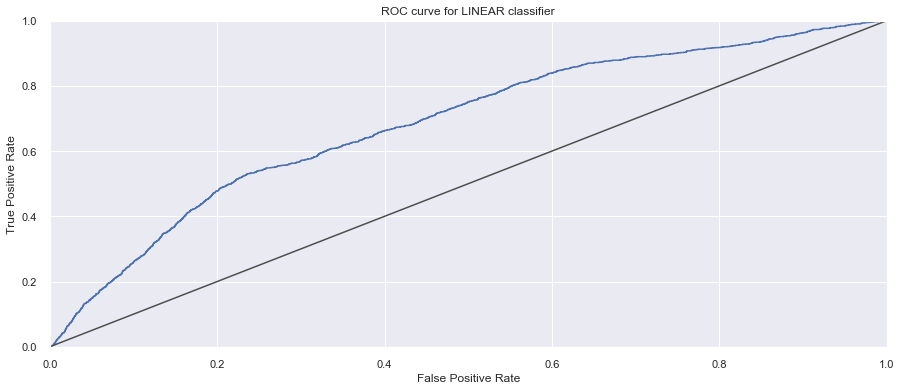

In [128]:
#PLOTTING ROC CURVE- ##KERNEL LINEAR
fpr,tpr,threshold=roc_curve(y_test,ylog_proba[:,1])

fig, ax = plt.subplots()  
ax.plot(fpr, tpr) 
ax.plot([0, 1], [0, 1], transform=ax.transAxes, ls="-", c=".3")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.rcParams['figure.figsize'] = (15, 5)
plt.title('ROC curve for LINEAR classifier', fontweight = 30)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [129]:
ylog_proba2=svc_model_rbf.predict_proba(X_test1) ##KERNEL RBF
fpr2,tpr2,threshold2=roc_curve(y_test,ylog_proba2[:,1])### Lets get the probabilit score for the class 1( we can get for 0 as well)  
roc_auc2=auc(fpr2,tpr2)   
print("Area under the Roc Curve : %f" % roc_auc2)



Area under the Roc Curve : 0.699985


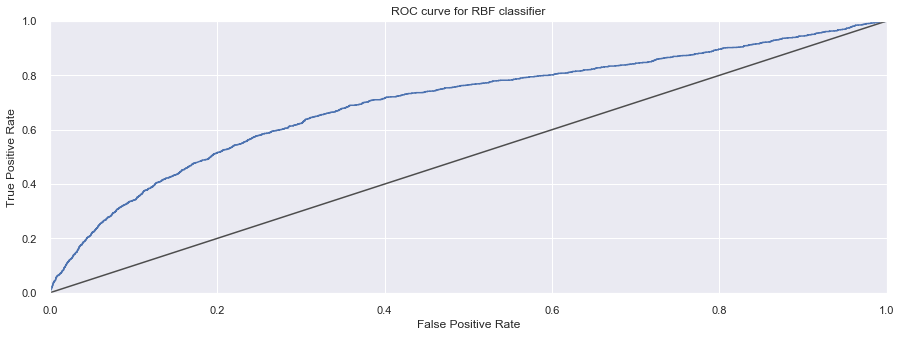

In [130]:
#PLOTTING ROC CURVE -##KERNEL RBF
fpr2,tpr2,threshold2=roc_curve(y_test,ylog_proba2[:,1])

fig, ax = plt.subplots()  
ax.plot(fpr2, tpr2)  
ax.plot([0, 1], [0, 1], transform=ax.transAxes, ls="-", c=".3")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.rcParams['figure.figsize'] = (15, 5)
plt.title('ROC curve for RBF classifier', fontweight = 30)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [131]:
ylog_proba3=svc_model_poly.predict_proba(X_test1) ##KERNEL POLY
fpr3,tpr3,threshold3=roc_curve(y_test,ylog_proba3[:,1])### Lets get the probabilit score for the class 1( we can get for 0 as well)  
roc_auc3=auc(fpr3,tpr3)   
print("Area under the Roc Curve : %f" % roc_auc3)



Area under the Roc Curve : 0.703346


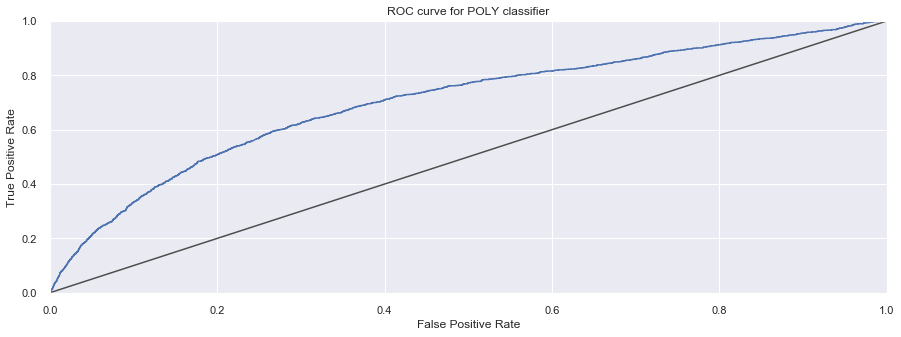

In [132]:
#PLOTTING ROC CURVE ##KERNEL POLY
fpr3,tpr3,threshold3=roc_curve(y_test,ylog_proba3[:,1])

fig, ax = plt.subplots()  
ax.plot(fpr3, tpr3) 
ax.plot([0, 1], [0, 1], transform=ax.transAxes, ls="-", c=".3")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
  
plt.rcParams['figure.figsize'] = (15, 5)
plt.title('ROC curve for POLY classifier', fontweight = 30)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

# GRIDSEARCH-SVM

In [285]:
params1 = {'C':[1,10],'gamma':['scale']}
 # AS WE COULD SEE ABOVE WITH ALL 3 KERNELS RBF PERFORMED WELL SO THE BASE KERNEL WILL BE RBF

modelQ1 = SVC(kernel='rbf')
clfq1 = RandomizedSearchCV(modelQ1, param_distributions=params1, cv=5, scoring='accuracy', random_state=25, n_jobs=-1, return_train_score=True)
clfq1.fit(X_train1, y_train_res)
print('Best parameters:  {}'.format(clfq1.best_params_))

print('Best score: {}'.format(clfq1.best_score_))

Best parameters:  {'gamma': 'scale', 'C': 10}
Best score: 0.8295687387524314


In [361]:
svc_model_rbf1 = SVC(kernel='rbf',probability=True,C=10,gamma='scale') # AFTER GRIDSEARCH
svc_model_rbf1.fit(X_train1, y_train_res)

prediction_rbf1 = svc_model_rbf1.predict(X_test1)
# check the accuracy on the training set
print(svc_model_rbf1.score(X_train1, y_train_res))
print(svc_model_rbf1.score(X_test1, y_test))

0.8516038951739939
0.7907696844588616


In [364]:
ylog_proba_rbf1=svc_model_rbf1.predict_proba(X_test1) #AFTER GRIDSEARCH
fpr_rbf1,tpr_rbf1,threshold_rbf1=roc_curve(y_test,ylog_proba_rbf1[:,1])### Lets get the probabilit score for the class 1( we can get for 0 as well)  
roc_auc_rbf1=auc(fpr_rbf1,tpr_rbf1)   
print("Area under the Roc Curve : %f" % roc_auc_rbf1)



Area under the Roc Curve : 0.695543


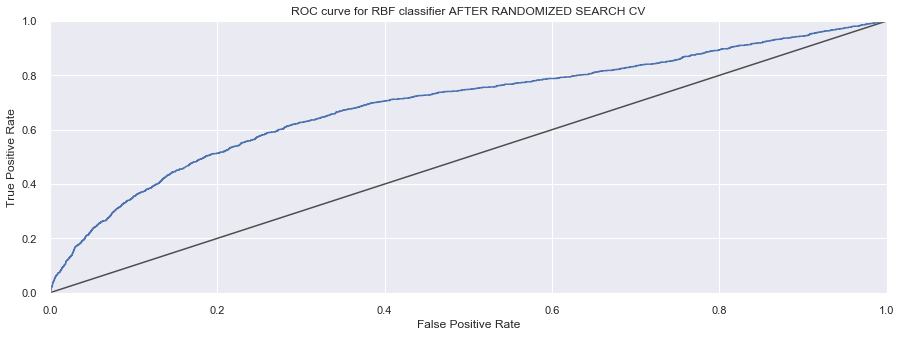

In [365]:
#PLOTTING ROC CURVE -AFTER GRIDSEARCH
fpr_rbf1,tpr_rbf1,threshold_rbf1=roc_curve(y_test,ylog_proba_rbf1[:,1])

fig, ax = plt.subplots()  
ax.plot(fpr_rbf1, tpr_rbf1) 
ax.plot([0, 1], [0, 1], transform=ax.transAxes, ls="-", c=".3")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
  
plt.rcParams['figure.figsize'] = (15, 5)
plt.title('ROC curve for RBF classifier AFTER RANDOMIZED SEARCH CV', fontweight = 30)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

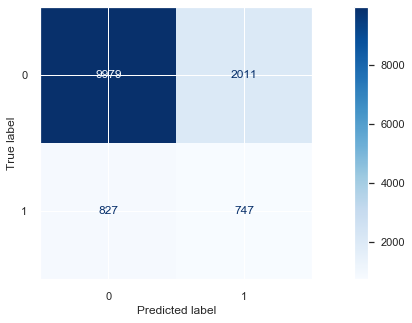

In [366]:
disp_rbf1=plot_confusion_matrix(svc_model_rbf1,X_test1,y_test,cmap='Blues',values_format='3') #AFTER GRIDSEARCH

In [367]:
disp_rbf1.confusion_matrix ##AFTER GRIDSEARCH

array([[9979, 2011],
       [ 827,  747]])

## ANALYSIS OF CONFUSION MATRIX-DECESION TREE 
TRUE POSITIVE(TP): The model correctly predicted that 747 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 9979 people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 2011 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 827 people will not take term deposit, but they did took term deposit 

In [368]:
print(classification_report(y_test,prediction_rbf1))  ##AFTER GRIDSEARCH

              precision    recall  f1-score   support

           0       0.92      0.83      0.88     11990
           1       0.27      0.47      0.34      1574

    accuracy                           0.79     13564
   macro avg       0.60      0.65      0.61     13564
weighted avg       0.85      0.79      0.81     13564



# DECESION TREES

In [134]:
DT_model=DecisionTreeClassifier()
DT_model.fit(X_train1, y_train_res)
 
DT_pred = DT_model.predict(X_test1)
# check the accuracy on the training set
print(DT_model.score(X_train1, y_train_res))  ## decision tree 
print(DT_model.score(X_test1, y_test))  ## test score 

1.0
0.7729283397227956


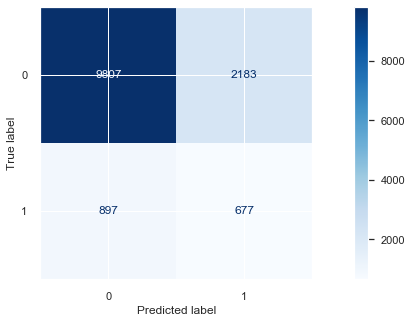

In [135]:
from sklearn.metrics import plot_confusion_matrix
disp8=plot_confusion_matrix(DT_model,X_test1,y_test,cmap='Blues',values_format='3') 

In [136]:
disp8.confusion_matrix

array([[9807, 2183],
       [ 897,  677]])

In [137]:
from sklearn.metrics import confusion_matrix, classification_report, f1_score
print(classification_report(y_test,DT_pred))  

              precision    recall  f1-score   support

           0       0.92      0.82      0.86     11990
           1       0.24      0.43      0.31      1574

    accuracy                           0.77     13564
   macro avg       0.58      0.62      0.58     13564
weighted avg       0.84      0.77      0.80     13564



# GRIDSEARCH DECISION TREE

In [138]:
def dtree_grid_search(X,y,nfolds): # nfolds = 5,4 -- 30*4 = 120 models
    #create a dictionary of all values we want to test
    param_grid = { 'criterion':['gini','entropy'],'max_depth': np.arange(17,23), 'min_samples_leaf':np.arange(20,25),'min_samples_split': np.arange(19,24)} # pruning -- param_grid should be in the form of dictionary 
    # decision tree model
    dtree_model = DecisionTreeClassifier()
    #use gridsearch to val all values
    dtree_gscv = GridSearchCV(dtree_model, param_grid, cv=nfolds) # 2 - modelName, paramters, cv
    #fit model to data
    dtree_gscv.fit(X, y) # X,y - train because you always fit on the train 
    #find score
    score = dtree_gscv.score(X, y) # score
    best_params = dtree_gscv.best_params_
    
    return best_params, score, dtree_gscv 

In [139]:
best_param, acc_DT_gs, dt_gs = dtree_grid_search(X_train1,y_train_res, 5) # after SMOTE
acc_val_DT_gs = dt_gs.score(X_test1, y_test)  

In [140]:
print(best_param)

{'criterion': 'entropy', 'max_depth': 21, 'min_samples_leaf': 23, 'min_samples_split': 21}


In [141]:
print(acc_DT_gs, acc_val_DT_gs) 

0.8649040526994128 0.8137717487466823


In [210]:
DT_model1=DecisionTreeClassifier(criterion='entropy', max_depth=21,min_samples_leaf=23,min_samples_split=21) # AFTER GRIDSERCH
DT_model1.fit(X_train1, y_train_res)

DT_pred1 = DT_model1.predict(X_test1)
# check the accuracy on the training set
print(DT_model1.score(X_train1, y_train_res))  ## decision tree 
print(DT_model1.score(X_test1, y_test))  ## test score 

0.8648324502362881
0.8139191978767325


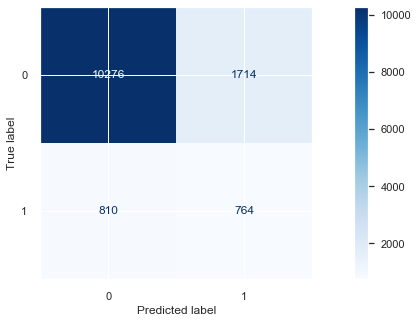

In [211]:
from sklearn.metrics import plot_confusion_matrix # AFTER GRIDSEARCH
disp9=plot_confusion_matrix(DT_model1,X_test1,y_test,cmap='Blues',values_format='3')

In [212]:
disp9.confusion_matrix  # AFTER GRIDSEARCH

array([[10276,  1714],
       [  810,   764]])

## ANALYSIS OF CONFUSION MATRIX

TRUE POSITIVE(TP): The model correctly predicted that 764 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 10276 people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 1714 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 810 people will not take term deposit, but they did took term deposit 

In [213]:
print(classification_report(y_test,DT_pred1))   # AFTER GRIDSEARCH

              precision    recall  f1-score   support

           0       0.93      0.86      0.89     11990
           1       0.31      0.49      0.38      1574

    accuracy                           0.81     13564
   macro avg       0.62      0.67      0.63     13564
weighted avg       0.86      0.81      0.83     13564



In [214]:
ylog_proba_dt=DT_model.predict_proba(X_test1) #BEFORE GRIDSEARCH
fpr_dt,tpr_dt,threshold_dt=roc_curve(y_test,ylog_proba_dt[:,1])### Lets get the probabilit score for the class 1( we can get for 0 as well)  
roc_auc_dt=auc(fpr_dt,tpr_dt)   
print("Area under the Roc Curve : %f" % roc_auc_dt)

Area under the Roc Curve : 0.624023


In [215]:
ylog_proba_dt1=DT_model1.predict_proba(X_test1) #AFTER GRIDSEARCH
fpr_dt1,tpr_dt1,threshold_dt1=roc_curve(y_test,ylog_proba_dt1[:,1])### Lets get the probabilit score for the class 1( we can get for 0 as well)  
roc_auc_dt1=auc(fpr_dt1,tpr_dt1)   
print("Area under the Roc Curve : %f" % roc_auc_dt1)



Area under the Roc Curve : 0.732162


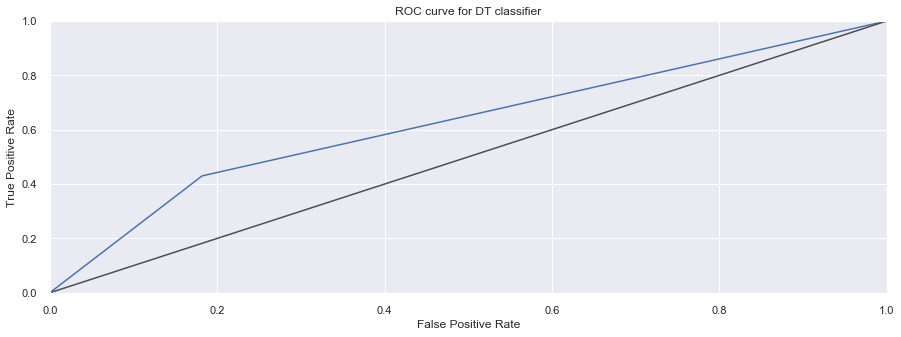

In [216]:
#PLOTTING ROC CURVE  BEFORE GRIDSEARCH DT
fpr_dt,tpr_dt,threshold_dt=roc_curve(y_test,ylog_proba_dt[:,1])

fig, ax = plt.subplots()  
ax.plot(fpr_dt, tpr_dt) 
ax.plot([0, 1], [0, 1], transform=ax.transAxes, ls="-", c=".3")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.rcParams['figure.figsize'] = (15, 5)   
plt.title('ROC curve for DT classifier', fontweight = 30)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

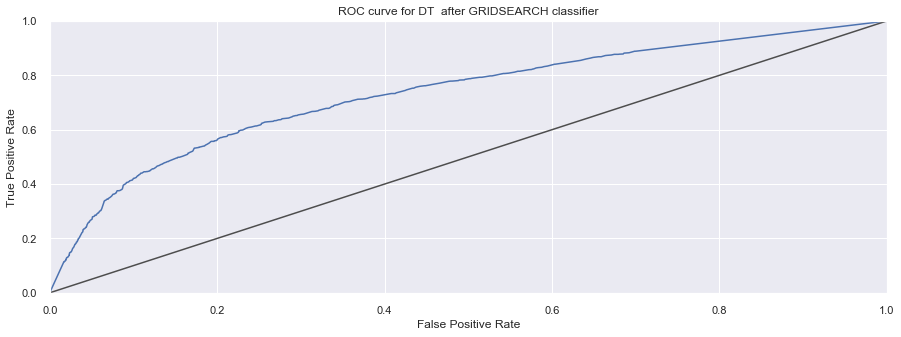

In [217]:
#PLOTTING ROC CURVE-AFTER GRIDSEARCH
ylog_proba_dt1=DT_model1.predict_proba(X_test1)
fpr_dt1,tpr_dt1,threshold_dt1=roc_curve(y_test,ylog_proba_dt1[:,1])

fig, ax = plt.subplots()  
ax.plot(fpr_dt1, tpr_dt1) 
ax.plot([0, 1], [0, 1], transform=ax.transAxes, ls="-", c=".3")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.rcParams['figure.figsize'] = (15, 5)
plt.title('ROC curve for DT  after GRIDSEARCH classifier', fontweight = 30)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [152]:
from sklearn.tree import plot_tree,export_text

In [446]:
## Calculating feature importance
feature_cols = X.columns
feat_importance = DT_model1.tree_.compute_feature_importances(normalize=False)


feat_imp_dict = dict(zip(feature_cols,DT_model1.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.sort_values(by=0, ascending=False) 

,0
housing,0.209264
month,0.158292
contact,0.135215
day,0.094895
balance,0.067047
loan,0.063318
job,0.061986
campaign,0.056591
age,0.046303
poutcome,0.037507


# 2.REMOVING UNIMPORTANT FEATURES AND RUNNING THE MODELS AGAIN

In [154]:
Xd=data1.drop(['age_group','Target','default','previous','pdays'],axis=1)#Creating catergorical features for age and balance
yd=data1['Target']

In [155]:
Xd_train, Xd_test, yd_train, y_test1 = train_test_split(Xd, yd, test_size = 0.3, random_state = 25)


In [156]:
sm = SMOTE(random_state=42) #smotting again after removing less important features
Xd_train_sm, y_train_res1 = sm.fit_resample(Xd_train, yd_train)
sc = StandardScaler()



In [157]:
X_train0 = sc.fit_transform(Xd_train_sm) # STANDARD SCALING THE X FEATURES
X_test0 = sc.transform(Xd_test)

In [158]:
# dictionary to store accuracy and roc score for each model
score = {}

# LOGISTIC REGRESSION- AFTER DELETING UNIMPORTANT FEATURES

In [329]:
log_new = LogisticRegression(C=25,penalty="l2",solver="liblinear",random_state=25)
log_new.fit(X_train0, y_train_res1)
y_probs_train_new = log_new.predict_proba(X_train0)
y_probs_test_new = log_new.predict_proba(X_test0)
y_predicted_train_new = log_new.predict(X_train0)
y_predicted_test_new = log_new.predict(X_test0)

# keep probabilities for the positive outcome only
y_probs_train12 = y_probs_train_new[:, 1] 
y_probs_test12 = y_probs_test_new[:, 1]
  
# calculate AUC and Accuracy after GRIDSEARCH        
train_auc_new = roc_auc_score(y_train_res1, y_probs_train12)
test_auc_new = roc_auc_score(y_test1, y_probs_test12)
train_acc_new = accuracy_score(y_train_res1, y_predicted_train_new)  
test_acc_new = accuracy_score(y_test1, y_predicted_test_new)
print('*'*50)
print('Train AUC: %.3f' % train_auc_new)
print('Test AUC: %.3f' % test_auc_new)
print('*'*50)
print('Train Accuracy: %.3f' % train_acc_new)
print('Test Accuracy: %.3f' % test_acc_new)

score['Logistic Regression-AFTER DELETING UNIMORTANT FEATURE'] = [test_auc_new, test_acc_new]  

parameters_new = log_new.coef_# printing the coefficents of different parameters after GRIDSEARCH
print(parameters_new)
intercept_new=log_new.intercept_
print(intercept_new)



**************************************************
Train AUC: 0.923
Test AUC: 0.839
**************************************************
Train Accuracy: 0.859
Test Accuracy: 0.821
[[-0.20527485 -0.05562592 -0.24228777 -0.16232099  0.05930888 -1.04482191
  -0.62738226 -0.8329597  -0.11006133  0.06075584  1.9371156  -0.73581673
  -0.46474866]]
[-0.11510279]


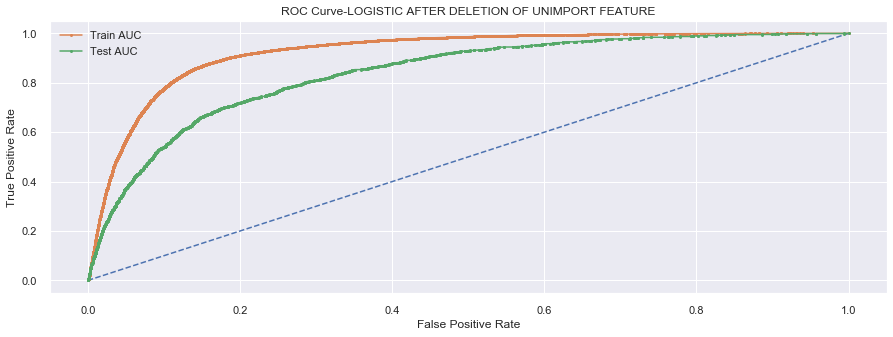

In [326]:
# calculate roc curve
train_fpr_log, train_tpr_log, train_thresholds_log = roc_curve(y_train_res1, y_probs_train12)
test_fpr_log, test_tpr_log, test_thresholds_log = roc_curve(y_test1, y_probs_test12)
plt.plot([0, 1], [0, 1], linestyle='--') 
# plot the roc curve for the model
plt.plot(train_fpr_log, train_tpr_log, marker='.', label='Train AUC')  
plt.plot(test_fpr_log, test_tpr_log, marker='.', label='Test AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve-LOGISTIC AFTER DELETION OF UNIMPORTANT FEATURE")
plt.show()

In [323]:
print(classification_report(y_test1,y_predicted_test_new)) #LOGISTIC AFTER DELETION OF UNIMPORTANT FEATURE

              precision    recall  f1-score   support

           0       0.95      0.84      0.89     11990
           1       0.36      0.67      0.47      1574

    accuracy                           0.82     13564
   macro avg       0.65      0.76      0.68     13564
weighted avg       0.88      0.82      0.84     13564



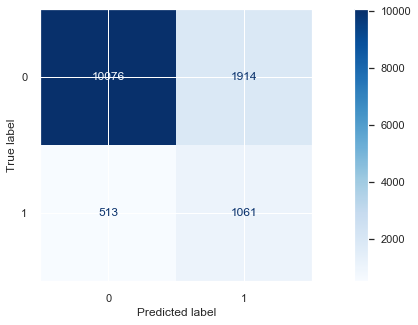

In [324]:
from sklearn.metrics import plot_confusion_matrix
disp_log_new=plot_confusion_matrix(log_new,X_test0,y_test1 ,cmap='Blues',values_format='3') #LOGISTIC AFTER DELETION OF UNIMPORTANT FEATURE

In [325]:
disp_log_new.confusion_matrix #LOGISTIC AFTER DELETION OF UNIMPORTANT FEATURE

array([[10076,  1914],
       [  513,  1061]])

## ANALYSIS OF CONFUSION MATRIX -LOGISTIC AFTER DELETION OF UNIMPORTANT FEATURE

TRUE POSITIVE(TP): The model correctly predicted that 1061 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 10076 people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 1914 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 513 people will not take term deposit, but they did took term deposit 

## ANALYSIS OF LOGISTIC MODEL

Precision of 0 (the client said no) represents that for all instances predicted as no subscription, the percentage of clients that actually said no is 95%.
Recall is the ability of a classifier to find all positive instances. Recall of 0 indicates that for all clients that actually said no, the model predicts 84% correctly that they would decline the offer.
In general, the report shows that LR model has great predictive power to identify the customers who would not subscribe to the term deposit.Accuracy score is the percentage of correct predictions out of all predictions made. The LR algorithm achieves an accuracy of 82%, suggesting high level of strength of this model to classify the customer response given all the defined customer features.

# KNN-AFTER DELETION OF UNIMPORTANT FEATURE AND AFTER GRIDSEARCH

In [374]:
knn2= KNeighborsClassifier(n_neighbors=13, weights = 'distance', metric = 'cityblock',p =2,algorithm='brute',leaf_size=30) 
knn2.fit(X_train0, y_train_res1)
y_probs_train_knn2 = knn2.predict_proba(X_train0)
y_probs_test_knn2 = knn2.predict_proba(X_test0)
y_predicted_train_knn2 = knn2.predict(X_train0)
y_predicted_test_knn2 = knn2.predict(X_test0)

# keep probabilities for the positive outcome only AFTER GRIDSEARCH
y_probs_train_knn2 = y_probs_train_knn2[:, 1]
y_probs_test_knn2 = y_probs_test_knn2[:, 1]
 
# calculate AUC and Accuracy AFTER GRIDSEARCH
train_auc_knn2 = roc_auc_score(y_train_res1, y_probs_train_knn2)
test_auc_knn2 = roc_auc_score(y_test1, y_probs_test_knn2)
train_acc_knn2 = accuracy_score(y_train_res1, y_predicted_train_knn2)
test_acc_knn2 = accuracy_score(y_test1, y_predicted_test_knn2)
print('*'*50)
print('Train AUC: %.3f' % train_auc_knn2)
print('Test AUC: %.3f' % test_auc_knn2) 
print('*'*50) 
print('Train Accuracy: %.3f' % train_acc_knn2) 
print('Test Accuracy: %.3f' % test_acc_knn2)

score['knn2'] = [test_auc_knn2, test_acc_knn2]  

**************************************************
Train AUC: 1.000
Test AUC: 0.863
**************************************************
Train Accuracy: 1.000
Test Accuracy: 0.871


In [331]:
print(classification_report(y_test1,y_predicted_test_knn2)

              precision    recall  f1-score   support

           0       0.95      0.91      0.93     11990
           1       0.46      0.60      0.52      1574

    accuracy                           0.87     13564
   macro avg       0.70      0.75      0.72     13564
weighted avg       0.89      0.87      0.88     13564



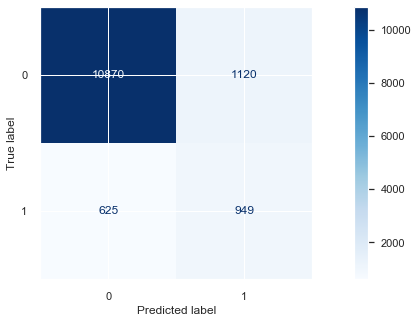

In [332]:
disp_knn2=plot_confusion_matrix(knn2,X_test0,y_test1,cmap='Blues',values_format='3')

In [333]:
disp_knn2.confusion_matrix

array([[10870,  1120],
       [  625,   949]])

## ANALYSIS OF CONFUSION MATRIX-KNN AFTER DELETION OF UNIMPORTANT FEATURE

TRUE POSITIVE(TP): The model correctly predicted that 949 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 10870 people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 1120 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 625 people will not take term deposit, but they did took term deposit 

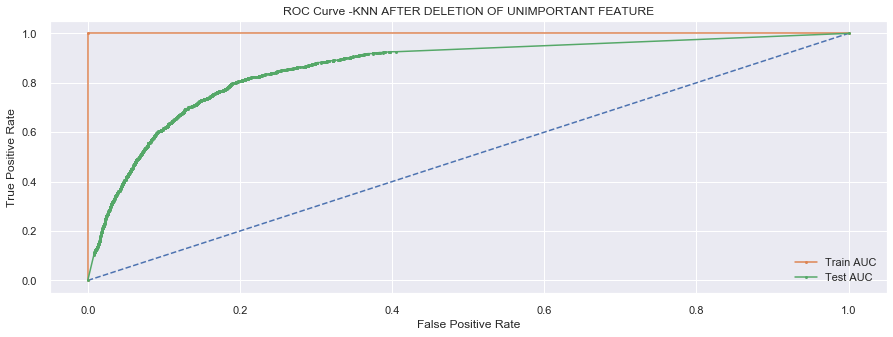

In [334]:
# calculate roc curve after GRIDSEARCH KNN
train_fpr_knn2, train_tpr_knn2, train_thresholds_knn2 = roc_curve(y_train_res1, y_probs_train_knn2)
test_fpr_knn2, test_tpr_knn2, test_thresholds_knn2 = roc_curve(y_test1, y_probs_test_knn2)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model AFTER GRIDSEARCH 
plt.plot(train_fpr_knn2, train_tpr_knn2, marker='.', label='Train AUC')
plt.plot(test_fpr_knn2, test_tpr_knn2, marker='.', label='Test AUC')
plt.legend()  
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve -KNN AFTER DELETION OF UNIMPORTANT FEATURE")
plt.show()

## ANALYSIS OF KNN MODEL

Precision of 0 (the client said no) represents that for all instances predicted as no subscription, the percentage of clients that actually said no is 95%.
Recall is the ability of a classifier to find all positive instances. Recall of 0 indicates that for all clients that actually said no, the model predicts 91% correctly that they would decline the offer.
In general, the report shows that KNN model has power to identify the customers who would not subscribe to the term deposit.Accuracy score is the percentage of correct predictions out of all predictions made. The KNN algorithm achieves an accuracy of 87%, suggesting high level of strength of this model to classify the customer response given all the defined customer features.

# NAIVE NAYES-AFTER DELETION OF UNIMPORTANT FEATURE

In [337]:
from sklearn.naive_bayes import GaussianNB

nb1 = GaussianNB()
nb1.fit(X_train0, y_train_res1)
y_probs_train_nb1 = nb1.predict_proba(X_train0)
y_probs_test_nb1 = nb1.predict_proba(X_test0) 
y_predicted_train_nb1 = nb1.predict(X_train0)
y_predicted_test_nb1 = nb1.predict(X_test0)

# keep probabilities for the positive outcome only
y_probs_train_nb1 = y_probs_train_nb1[:, 1]
y_probs_test_nb1 = y_probs_test_nb1[:, 1]
 
# calculate AUC and Accuracy
train_auc_nb1 = roc_auc_score(y_train_res1, y_probs_train_nb1)
test_auc_nb1 = roc_auc_score(y_test1, y_probs_test_nb1)
train_acc_nb1 = accuracy_score(y_train_res1, y_predicted_train_nb1)
test_acc_nb1 = accuracy_score(y_test1, y_predicted_test_nb1)
print('*'*50)
print('Train AUC: %.3f' % train_auc_nb1)
print('Test AUC: %.3f' % test_auc_nb1)
print('*'*50) 
print('Train Accuracy: %.3f' % train_acc_nb1)
print('Test Accuracy: %.3f' % test_acc_nb1)

score['NAIVE BAYES-AFTER DELETION OF UNIMPORTANT FEATURE'] = [test_auc_nb1, test_acc_nb1]  

**************************************************
Train AUC: 0.886
Test AUC: 0.769
**************************************************
Train Accuracy: 0.777
Test Accuracy: 0.650


In [338]:
print(classification_report(y_test1,y_predicted_test_nb1))  

              precision    recall  f1-score   support

           0       0.95      0.64      0.76     11990
           1       0.22      0.76      0.34      1574

    accuracy                           0.65     13564
   macro avg       0.58      0.70      0.55     13564
weighted avg       0.87      0.65      0.71     13564



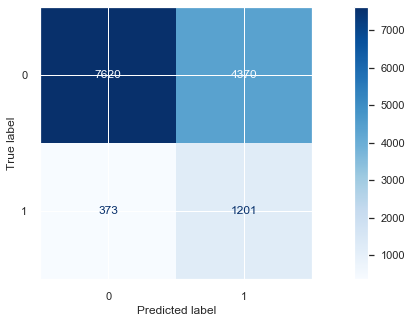

In [339]:
disp_nb1=plot_confusion_matrix(nb1,X_test0,y_test1,cmap='Blues',values_format='3')

In [340]:
disp_nb1.confusion_matrix

array([[7620, 4370],
       [ 373, 1201]])

## ANALYSIS OF CONFUSION MATRIX-NB AFTER DELETION OF UNIMPORTANT FEATURE

TRUE POSITIVE(TP): The model correctly predicted that 1201people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 7620people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 4370 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 373 people will not take term deposit, but they did took term deposit 

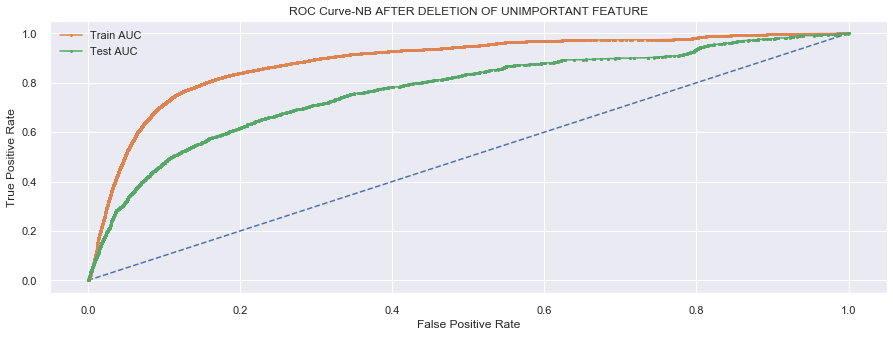

In [341]:
# calculate roc curve
train_fpr_nb1, train_tpr_nb1, train_thresholds_nb1 = roc_curve(y_train_res1, y_probs_train_nb1)
test_fpr_nb1, test_tpr_nb1, test_thresholds_nb1 = roc_curve(y_test1, y_probs_test_nb1)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr_nb1, train_tpr_nb1, marker='.', label='Train AUC')
plt.plot(test_fpr_nb1, test_tpr_nb1, marker='.', label='Test AUC')  
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve-NB AFTER DELETION OF UNIMPORTANT FEATURE")
plt.show()

## ANALYSIS OF NAIVE BAYES MODEL
Precision of 0 (the client said no) represents that for all instances predicted as no subscription, the percentage of clients that actually said no is 95%. Recall is the ability of a classifier to find all positive instances. Recall of 0 indicates that for all clients that actually said no, the model predicts 64% correctly that they would decline the offer. Accuracy score is the percentage of correct predictions out of all predictions made. The NB algorithm achieves an accuracy of 65%, suggesting LOW level of strength of this model to classify the customer response given all the defined customer features.

# SVM-AFTER DELETION OF UNIMPORTANT FEATURE

In [417]:
svc_model_rbf2 = SVC(kernel='rbf',probability=True,C=10,gamma='scale')
svc_model_rbf2.fit(X_train0, y_train_res1)

prediction_rbf2 = svc_model_rbf2.predict(X_test0)
# check the accuracy on the training set
print(svc_model_rbf2.score(X_train0, y_train_res1))
print(svc_model_rbf2.score(X_test0, y_test1))

0.9277889159387083
0.8615452668829254


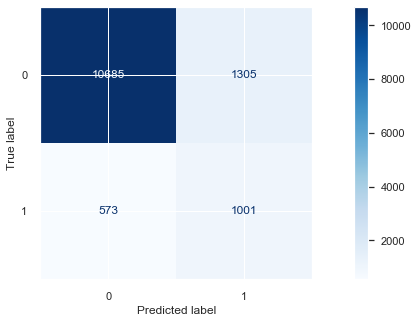

In [344]:
disp_rbfnew=plot_confusion_matrix(svc_model_rbf2,X_test0,y_test1,cmap='Blues',values_format='3')

In [345]:
disp_rbfnew.confusion_matrix

array([[10685,  1305],
       [  573,  1001]])

## ANALYSIS OF CONFUSION MATRIX-SVC AFTER DELETION OF UNIMPORTANT FEATURE

TRUE POSITIVE(TP): The model correctly predicted that 1001 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 10685 people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 1305 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 573 people will not take term deposit, but they did took term deposit 

In [346]:
print(classification_report(y_test1,prediction_rbf2))  

              precision    recall  f1-score   support

           0       0.95      0.89      0.92     11990
           1       0.43      0.64      0.52      1574

    accuracy                           0.86     13564
   macro avg       0.69      0.76      0.72     13564
weighted avg       0.89      0.86      0.87     13564



In [421]:
ylog_proba_rbf2=svc_model_rbf2.predict_proba(X_test0)
ylog_proba_rbf21=ylog_proba_rbf2[:,1] 
fpr_rbf2,tpr_rbf2,threshold_rbf2=roc_curve(y_test1,ylog_proba_rbf2[:,1])### Lets get the probabilit score for the class 1( we can get for 0 as well)  
roc_auc_rbf2=auc(fpr_rbf2,tpr_rbf2)   
print("Area under the Roc Curve : %f" % roc_auc_rbf2)



Area under the Roc Curve : 0.876254


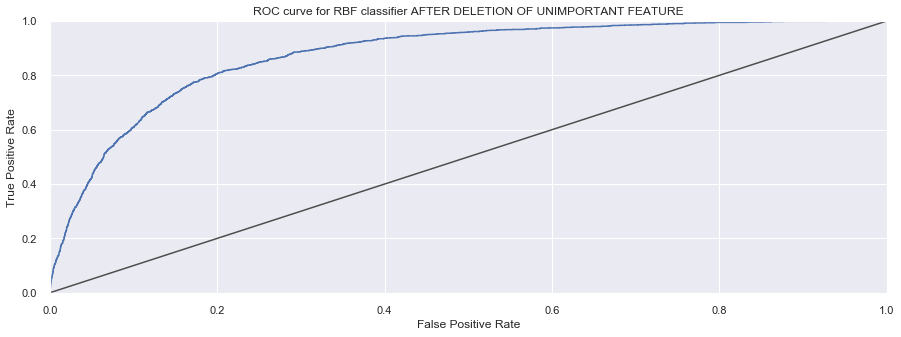

In [351]:
#PLOTTING ROC CURVE
fpr_rbfnew,tpr_rbfnew,threshold_rbfnew=roc_curve(y_test1,ylog_proba_rbfnew[:,1])

fig, ax = plt.subplots()  
ax.plot(fpr_rbfnew, tpr_rbfnew) 
ax.plot([0, 1], [0, 1], transform=ax.transAxes, ls="-", c=".3")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.rcParams['figure.figsize'] = (15, 5)
plt.title('ROC curve for RBF classifier AFTER DELETION OF UNIMPORTANT FEATURE', fontweight = 30)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

## ANALYSIS OF SVM MODEL
Precision of 0 (the client said no) represents that for all instances predicted as no subscription, the percentage of clients that actually said no is 95%. Recall is the ability of a classifier to find all positive instances. Recall of 0 indicates that for all clients that actually said no, the model predicts 89% correctly that they would decline the offer. Accuracy score is the percentage of correct predictions out of all predictions made. The SVM algorithm achieves an accuracy of 86%, suggesting high level of strength of this model to classify the customer response given all the defined customer features.

In [159]:
DT_m=DecisionTreeClassifier(criterion='entropy', max_depth=19,min_samples_leaf=21,ccp_alpha=.001)#AFTER FEATURE IMPORTANCE AND GRIDSEARCH 
DT_m.fit(X_train0, y_train_res1)

DT_p = DT_m.predict(X_test0)
# check the accuracy on the training set
print(DT_m.score(X_train0, y_train_res1))  ## decision tree 
print(DT_m.score(X_test0, y_test1))  ## test score 

0.8878347415151081
0.846726629312887


In [160]:
plt.figure(figsize=(400,200))
plot_tree(DT_m,feature_names=X.columns,class_names = ['0','1','2'],filled=True);

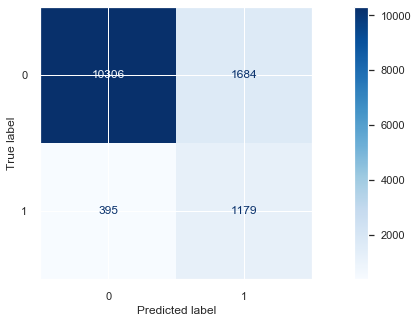

In [161]:
disp_dt_m=plot_confusion_matrix(DT_m,X_test0,y_test1,cmap='Blues',values_format='3')# AFTER FEATURE IMPORTANCE AND GRIDSEARCH

In [162]:
disp_dt_m.confusion_matrix #AFTER FEATURE IMPORTANCE AND GRIDSEARCH

array([[10306,  1684],
       [  395,  1179]])

## ANALYSIS OF CONFUSION MATRIX-DECISION TREE AFTER DELETION OF UNIMPORTANT FEATURE

TRUE POSITIVE(TP): The model correctly predicted that 1179 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 10306people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 1684 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 395 people will not take term deposit, but they did took term deposit 

In [163]:
print(classification_report(y_test1,DT_p))  # AFTER FEATURE IMPORTANCE AND GRIDSEARCH

              precision    recall  f1-score   support

           0       0.96      0.86      0.91     11990
           1       0.41      0.75      0.53      1574

    accuracy                           0.85     13564
   macro avg       0.69      0.80      0.72     13564
weighted avg       0.90      0.85      0.86     13564



In [164]:
ylog_proba_dtm=DT_m.predict_proba(X_test0)
fpr_dtm,tpr_dtm,threshold_dtm=roc_curve(y_test1,ylog_proba_dtm[:,1])### Lets get the probabilit score for the class 1( we can get for 0 as well)  
roc_auc_dtm=auc(fpr_dtm,tpr_dtm)   
print("Area under the Roc Curve : %f" % roc_auc_dtm)

Area under the Roc Curve : 0.872881


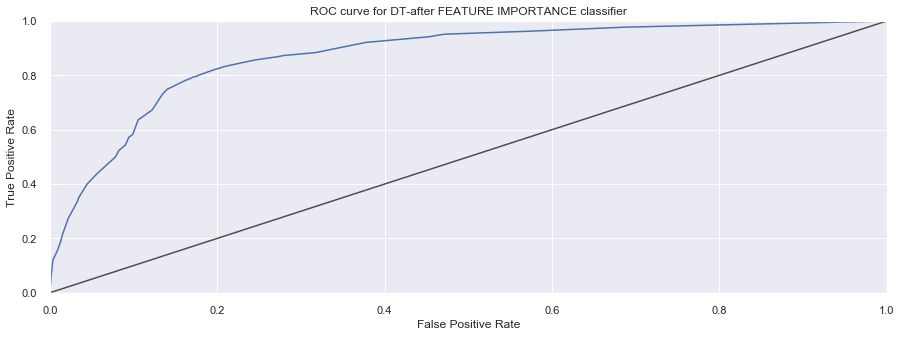

In [165]:
#PLOTTING ROC CURVE AFTER FEATURE IMPORTANCE AND GRIDSEARCH
fpr_dtm,tpr_dtm,threshold_dtm=roc_curve(y_test1,ylog_proba_dtm[:,1])

fig, ax = plt.subplots()  
ax.plot(fpr_dtm, tpr_dtm) 
ax.plot([0, 1], [0, 1], transform=ax.transAxes, ls="-", c=".3")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.rcParams['figure.figsize'] = (15, 5)
plt.title('ROC curve for DT-after FEATURE IMPORTANCE classifier', fontweight = 30)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

## ANALYSIS OF DECISION TREE MODEL
Precision of 0 (the client said no) represents that for all instances predicted as no subscription, the percentage of clients that actually said no is 96%. Recall is the ability of a classifier to find all positive instances. Recall of 0 indicates that for all clients that actually said no, the model predicts 86% correctly that they would decline the offer. Accuracy score is the percentage of correct predictions out of all predictions made. The DT algorithm achieves an accuracy of 85%, suggesting HIGH level of strength of this model to classify the customer response given all the defined customer features.

In [166]:
RF_model = RandomForestClassifier() 
RF_model.fit(X_train0, y_train_res1)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [167]:
print(RF_model.score(X_train0, y_train_res1))
print(RF_model.score(X_test0, y_test1))
predictions_RF = RF_model.predict(X_test0) 

1.0
0.8853583013860218


In [168]:
print(classification_report(y_test1, predictions_RF))

              precision    recall  f1-score   support

           0       0.95      0.92      0.93     11990
           1       0.50      0.66      0.57      1574

    accuracy                           0.89     13564
   macro avg       0.73      0.79      0.75     13564
weighted avg       0.90      0.89      0.89     13564



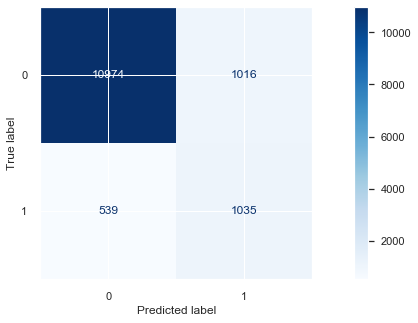

In [169]:
disp_RF=plot_confusion_matrix(RF_model,X_test0,y_test1,cmap='Blues',values_format='3')

In [170]:
disp_RF.confusion_matrix

array([[10974,  1016],
       [  539,  1035]])

In [171]:
#Calculating AREA under thr ROC curve
ylog_proba_RF=RF_model.predict_proba(X_test0)
ylog_proba_RF_train=RF_model.predict_proba(X_train0)
fpr_RF,tpr_RF,threshold_RF=roc_curve(y_test1,ylog_proba_RF[:,1])### Lets get the probabilit score for the class 1( we can get for 0 as well)  
fpr_RF_train,tpr_RF_train,threshold_RF_train=roc_curve(y_train_res1,ylog_proba_RF_train[:,1])
roc_auc_RF=auc(fpr_RF,tpr_RF) 
roc_auc_RF_train=auc(fpr_RF_train,tpr_RF_train)
print("Area under the Roc Curve : %f" % roc_auc_RF)
print("Area under the Roc Curve Train : %f" % roc_auc_RF_train)

Area under the Roc Curve : 0.909685
Area under the Roc Curve Train : 1.000000


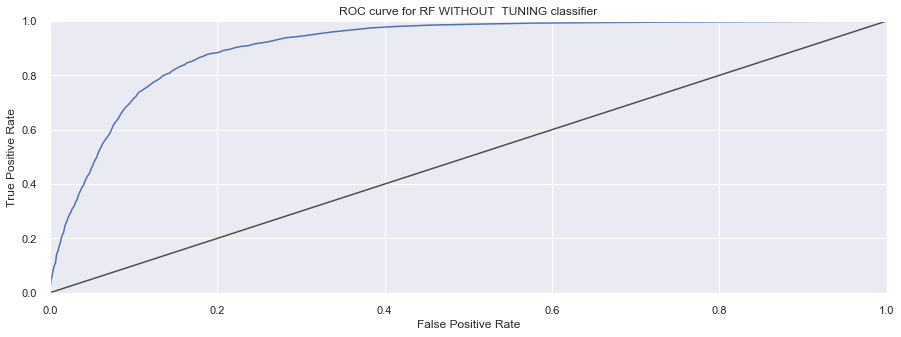

In [172]:
#PLOTTING ROC CURVE  
fpr_RF,tpr_RF,threshold_RF=roc_curve(y_test1,ylog_proba_RF[:,1])
 
fig, ax = plt.subplots()  
ax.plot(fpr_RF, tpr_RF) 
ax.plot([0, 1], [0, 1], transform=ax.transAxes, ls="-", c=".3")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.rcParams['figure.figsize'] = (15, 5)
plt.title('ROC curve for RF WITHOUT  TUNING classifier', fontweight = 30)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

# GRIDSEARCH FOR TUNING PARAMETERS-RANDOM FOREST CLASSIFIER

In [173]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train0, y_train_res1)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [174]:
params = {'n_estimators':[500,750], 'max_depth':np.arange(22,26),'criterion' :['gini', 'entropy']}
clf = GridSearchCV(rf_model,params, cv=5, n_jobs=-1, return_train_score=True)
clf.fit(X_train0, y_train_res1)
print('Best parameters:  {}'.format(clf.best_params_))
print(" Training score",clf.score(X_train0,y_train_res1))

Best parameters:  {'criterion': 'entropy', 'max_depth': 25, 'n_estimators': 750}
 Training score 1.0


In [175]:
clf_pred=clf.predict(X_test0)
accuracy=accuracy_score(y_test1,clf_pred)
print(accuracy)



0.8853583013860218


In [176]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score

In [219]:
rf_model = RandomForestClassifier(n_estimators=750, max_depth=25,criterion='entropy', n_jobs=-1,ccp_alpha=.003,random_state=42)
rf_model.fit(X_train0, y_train_res1)
y_probs_train_rf_model = rf_model.predict_proba(X_train0)
y_probs_test_rf_model = rf_model.predict_proba(X_test0)
y_predicted_train_rf_model = rf_model.predict(X_train0)  
y_predicted_test_rf_model = rf_model.predict(X_test0)

# keep probabilities for the positive outcome only  AFTER GRIDSEARCH
y_probs_train_rf_model = y_probs_train_rf_model[:, 1]
y_probs_test_rf_model = y_probs_test_rf_model[:, 1]
 
# calculate AUC and Accuracy AFTER GRIDSEARCH
train_auc_rf_model = roc_auc_score(y_train_res1, y_probs_train_rf_model)
test_auc_rf_model = roc_auc_score(y_test1, y_probs_test_rf_model)
train_acc_rf_model = accuracy_score(y_train_res1, y_predicted_train_rf_model)
test_acc_rf_model = accuracy_score(y_test1, y_predicted_test_rf_model)
print('*'*50)
print('Train AUC: %.3f' % train_auc_rf_model)
print('Test AUC: %.3f' % test_auc_rf_model)
print('*'*50)
print('Train Accuracy: %.3f' % train_acc_rf_model)
print('Test Accuracy: %.3f' % test_acc_rf_model)

score['RF_model'] = [test_auc_rf_model, test_acc_rf_model]  

**************************************************
Train AUC: 0.955
Test AUC: 0.881
**************************************************
Train Accuracy: 0.887
Test Accuracy: 0.841


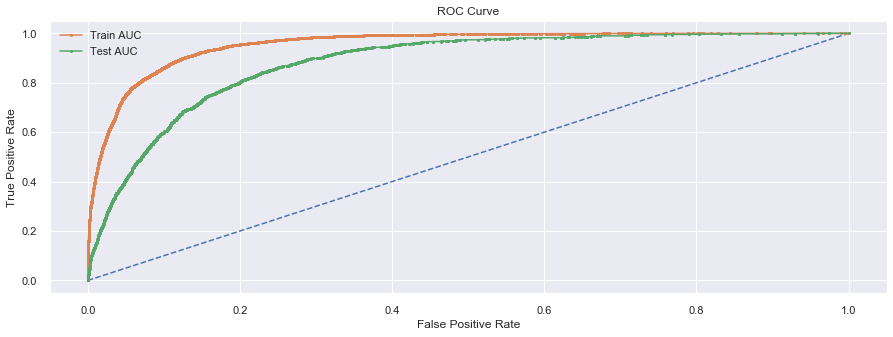

In [220]:
# calculate roc curve AFTER GRIDSEARCH 
train_fpr_rf_model, train_tpr_rf_model, train_thresholds_rf_model = roc_curve(y_train_res1, y_probs_train_rf_model)
test_fpr_rf_model, test_tpr_rf_model, test_thresholds_rf_model = roc_curve(y_test1, y_probs_test_rf_model)
plt.plot([0, 1], [0, 1], linestyle='--') 
# plot the roc curve for the model
plt.plot(train_fpr_rf_model, train_tpr_rf_model, marker='.', label='Train AUC')  
plt.plot(test_fpr_rf_model, test_tpr_rf_model, marker='.', label='Test AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.show()

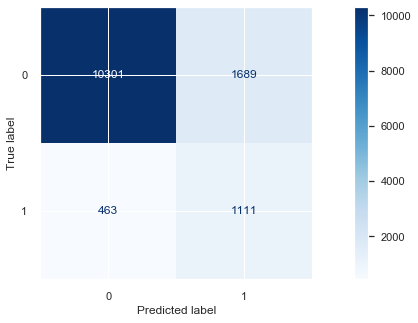

In [221]:
disp_rf_gs=plot_confusion_matrix(rf_model,X_test0,y_test1,cmap='Blues',values_format='3')# CONFUSION MATRIX AFTER GRIDSEARCH

In [222]:
disp_rf_gs.confusion_matrix# CONFUSION MATRIX AFTER GRIDSEARCH

array([[10301,  1689],
       [  463,  1111]])

## ANALYSIS OF CONFUSION MATRIX-RANDOM FOREST AFTER DELETION OF UNIMPORTANT FEATURE

TRUE POSITIVE(TP): The model correctly predicted that 1111 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 10301 people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 1689 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 463 people will not take term deposit, but they did took term deposit 

In [223]:
print(classification_report(y_test1, y_predicted_test_rf_model))#AFTER GRIDSEARCH

              precision    recall  f1-score   support

           0       0.96      0.86      0.91     11990
           1       0.40      0.71      0.51      1574

    accuracy                           0.84     13564
   macro avg       0.68      0.78      0.71     13564
weighted avg       0.89      0.84      0.86     13564



## ANALYSIS OF RANDOM FOREST MODEL
Precision of 0 (the client said no) represents that for all instances predicted as no subscription, the percentage of clients that actually said no is 96%. Recall is the ability of a classifier to find all positive instances. Recall of 0 indicates that for all clients that actually said no, the model predicts 86% correctly that they would decline the offer. Accuracy score is the percentage of correct predictions out of all predictions made. The RF algorithm achieves an accuracy of 84%, suggesting GOOD level of strength of this model to classify the customer response given all the defined customer features.

# ADABOOST CLASSIFIER

In [182]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(n_estimators=500,base_estimator=DT_m) 
abcl.fit(X_train0, y_train_res1)

AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=DecisionTreeClassifier(ccp_alpha=0.001,
                                                         class_weight=None,
                                                         criterion='entropy',
                                                         max_depth=19,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=21,
                                                         min_samples_split=2,
                                                         min_weight_fraction_leaf=0.0,
                                                         presort='deprecated',
                   

In [183]:

y_probs_train_abcl = abcl.predict_proba(X_train0)
y_probs_test_abcl = abcl.predict_proba(X_test0)
y_predicted_train_abcl = abcl.predict(X_train0)
y_predicted_test_abcl = abcl.predict(X_test0)
 
# keep probabilities for the positive outcome only
y_probs_train_abcl = y_probs_train_abcl[:, 1]
y_probs_test_abcl = y_probs_test_abcl[:, 1]
 
# calculate AUC and Accuracy
train_auc_abcl = roc_auc_score(y_train_res1, y_probs_train_abcl)
test_auc_abcl = roc_auc_score(y_test1, y_probs_test_abcl)
train_acc_abcl = accuracy_score(y_train_res1, y_predicted_train_abcl)
test_acc_abcl = accuracy_score(y_test1, y_predicted_test_abcl)
print('*'*50)
print('Train AUC: %.3f' % train_auc_abcl)
print('Test AUC: %.3f' % test_auc_abcl)
print('*'*50)
print('Train Accuracy: %.3f' % train_acc_abcl)
print('Test Accuracy: %.3f' % test_acc_abcl)

score['ADABOOST'] = [test_auc_abcl, test_acc_abcl]  



**************************************************
Train AUC: 0.979
Test AUC: 0.903
**************************************************
Train Accuracy: 0.921
Test Accuracy: 0.874


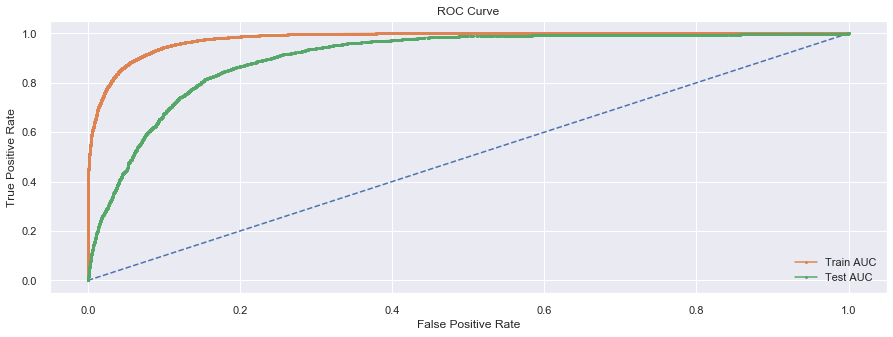

In [184]:
# calculate roc curve
train_fpr_abcl, train_tpr_abcl, train_thresholds_abcl = roc_curve(y_train_res1, y_probs_train_abcl)
test_fpr_abcl, test_tpr_abcl, test_thresholds_abcl = roc_curve(y_test1, y_probs_test_abcl)
plt.plot([0, 1], [0, 1], linestyle='--') 
# plot the roc curve for the model
plt.plot(train_fpr_abcl, train_tpr_abcl, marker='.', label='Train AUC')  
plt.plot(test_fpr_abcl, test_tpr_abcl, marker='.', label='Test AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.show()

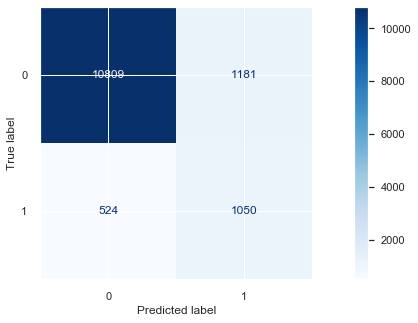

In [185]:
disp_abcl=plot_confusion_matrix(abcl,X_test0,y_test1,cmap='Blues',values_format='3')

In [186]:
disp_abcl.confusion_matrix

array([[10809,  1181],
       [  524,  1050]])

In [187]:
print(classification_report(y_test1, y_predicted_test_abcl))

              precision    recall  f1-score   support

           0       0.95      0.90      0.93     11990
           1       0.47      0.67      0.55      1574

    accuracy                           0.87     13564
   macro avg       0.71      0.78      0.74     13564
weighted avg       0.90      0.87      0.88     13564



# GRIDSEARCH-ADABOOST

In [224]:
params = {'n_estimators':[700,1000], 'learning_rate':[.05,1]}
model = AdaBoostClassifier(base_estimator=DT_m,random_state=25)
abc = GridSearchCV(model,params, cv=5, n_jobs=-1, return_train_score=True)
abc.fit(X_train0, y_train_res1)
print('Best parameters:  {}'.format(abc.best_params_))
print(" Training score",abc.score(X_train0,y_train_res1)) 

Best parameters:  {'learning_rate': 1, 'n_estimators': 1000}
 Training score 0.9205570671631104


In [225]:
abcl1 = AdaBoostClassifier(n_estimators=1000,learning_rate= 1 ,base_estimator=DT_m,random_state=25) #AFTER GRIDSEARCH
abcl1.fit(X_train0, y_train_res1)
y_probs_train_abcl1 = abcl1.predict_proba(X_train0)
y_probs_test_abcl1 = abcl1.predict_proba(X_test0)
y_predicted_train_abcl1 = abcl1.predict(X_train0)
y_predicted_test_abcl1 = abcl1.predict(X_test0)
 
# keep probabilities for the positive outcome only
y_probs_train_abcl1 = y_probs_train_abcl1[:, 1]
y_probs_test_abcl1 = y_probs_test_abcl1[:, 1]
  
# calculate AUC and Accuracy
train_auc_abcl1 = roc_auc_score(y_train_res1, y_probs_train_abcl1)
test_auc_abcl1 = roc_auc_score(y_test1, y_probs_test_abcl1)
train_acc_abcl1 = accuracy_score(y_train_res1, y_predicted_train_abcl1)
test_acc_abcl1 = accuracy_score(y_test1, y_predicted_test_abcl1)
print('*'*50)
print('Train AUC: %.3f' % train_auc_abcl1)
print('Test AUC: %.3f' % test_auc_abcl1)
print('*'*50)
print('Train Accuracy: %.3f' % train_acc_abcl1)
print('Test Accuracy: %.3f' % test_acc_abcl1)

score['ABCL1'] = [test_auc_abcl1, test_acc_abcl1]  

**************************************************
Train AUC: 0.979
Test AUC: 0.903
**************************************************
Train Accuracy: 0.921
Test Accuracy: 0.874


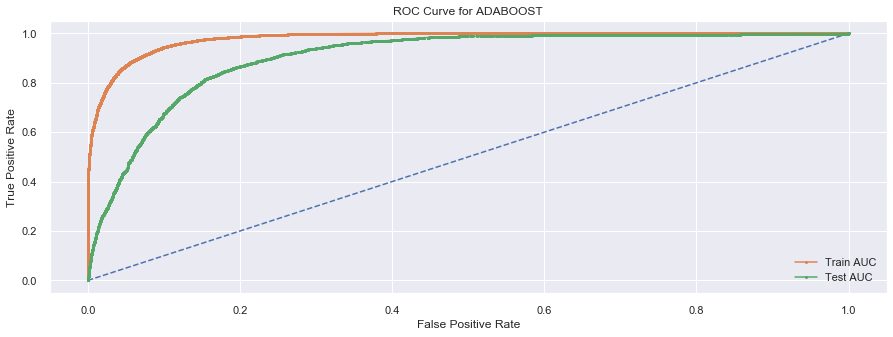

In [226]:
# calculate roc curve after GRIDSEARCH
train_fpr_abcl1, train_tpr_abcl1, train_thresholds_abcl1 = roc_curve(y_train_res1, y_probs_train_abcl1)
test_fpr_abcl1, test_tpr_abcl1, test_thresholds_abcl1 = roc_curve(y_test1, y_probs_test_abcl1)
plt.plot([0, 1], [0, 1], linestyle='--')  
# plot the roc curve for the model AFTER GRIDSEARCH
plt.plot(train_fpr_abcl1, train_tpr_abcl1, marker='.', label='Train AUC')  
plt.plot(test_fpr_abcl1, test_tpr_abcl1, marker='.', label='Test AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for ADABOOST")
plt.show()

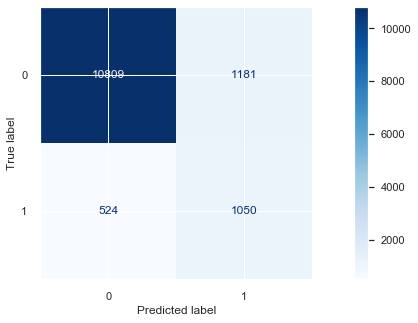

In [227]:
disp_abcl1=plot_confusion_matrix(abcl1,X_test0,y_test1,cmap='Blues',values_format='3')# after GRIDSEARCH

In [228]:
disp_abcl1.confusion_matrix #after GRIDSEARCH

array([[10809,  1181],
       [  524,  1050]])

## ANALYSIS OF CONFUSION MATRIX-ADABOOST AFTER DELETION OF UNIMPORTANT FEATURE

TRUE POSITIVE(TP): The model correctly predicted that 1050 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 10809 people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 1181 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 524 people will not take term deposit, but they did took term deposit 

In [230]:
print(classification_report(y_test1,y_predicted_test_abcl1))# after GRIDSEARCH

              precision    recall  f1-score   support

           0       0.95      0.90      0.93     11990
           1       0.47      0.67      0.55      1574

    accuracy                           0.87     13564
   macro avg       0.71      0.78      0.74     13564
weighted avg       0.90      0.87      0.88     13564



## ANALYSIS OF ADABOOST MODEL
Precision of 0 (the client said no) represents that for all instances predicted as no subscription, the percentage of clients that actually said no is 95%. Recall is the ability of a classifier to find all positive instances. Recall of 0 indicates that for all clients that actually said no, the model predicts 90% correctly that they would decline the offer. Accuracy score is the percentage of correct predictions out of all predictions made. The ADABOOST algorithm achieves an accuracy of 87%, suggesting GOOD level of strength of this model to classify the customer response given all the defined customer features.

# BAGGING CLASSIFIER

In [189]:
from sklearn.ensemble import BaggingClassifier
bgcl = BaggingClassifier(random_state=25,base_estimator=DT_m) 
bgcl.fit(X_train0, y_train_res1)

BaggingClassifier(base_estimator=DecisionTreeClassifier(ccp_alpha=0.001,
                                                        class_weight=None,
                                                        criterion='entropy',
                                                        max_depth=19,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=21,
                                                        min_samples_split=2,
                                                        min_weight_fraction_leaf=0.0,
                                                        presort='deprecated',
                                                        random_state=No

In [190]:
y_probs_train_bgcl = bgcl.predict_proba(X_train0)
y_probs_test_bgcl = bgcl.predict_proba(X_test0)
y_predicted_train_bgcl = bgcl.predict(X_train0)
y_predicted_test_bgcl = bgcl.predict(X_test0)

# keep probabilities for the positive outcome only
y_probs_train_bgcl = y_probs_train_bgcl[:, 1]
y_probs_test_bgcl = y_probs_test_bgcl[:, 1]
 
# calculate AUC and Accuracy
train_auc_bgcl = roc_auc_score(y_train_res1, y_probs_train_bgcl)
test_auc_bgcl = roc_auc_score(y_test1, y_probs_test_bgcl)
train_acc_bgcl = accuracy_score(y_train_res1, y_predicted_train_bgcl)
test_acc_bgcl = accuracy_score(y_test1, y_predicted_test_bgcl)
print('*'*50)
print('Train AUC: %.3f' % train_auc_bgcl)
print('Test AUC: %.3f' % test_auc_bgcl)
print('*'*50)
print('Train Accuracy: %.3f' % train_acc_bgcl)
print('Test Accuracy: %.3f' % test_acc_bgcl)

score['bgcl'] = [test_auc_bgcl, test_acc_bgcl]  

**************************************************
Train AUC: 0.956
Test AUC: 0.884
**************************************************
Train Accuracy: 0.889
Test Accuracy: 0.852


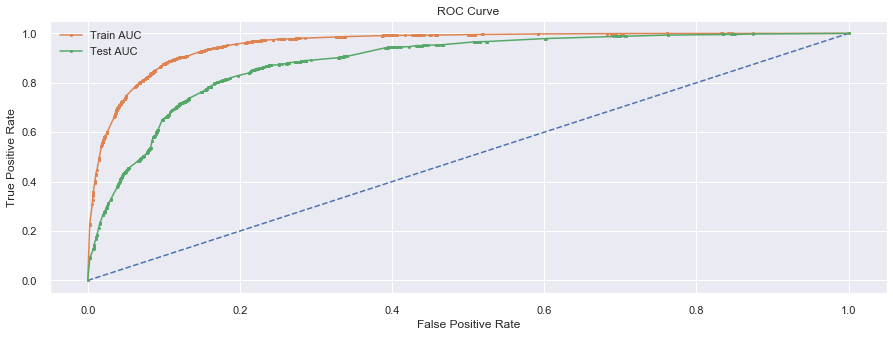

In [191]:
# calculate roc curve
train_fpr_bgcl, train_tpr_bgcl, train_thresholds_bgcl = roc_curve(y_train_res1, y_probs_train_bgcl)
test_fpr_bgcl, test_tpr_bgcl, test_thresholds_bgcl = roc_curve(y_test1, y_probs_test_bgcl)
plt.plot([0, 1], [0, 1], linestyle='--') 
# plot the roc curve for the model
plt.plot(train_fpr_bgcl, train_tpr_bgcl, marker='.', label='Train AUC')  
plt.plot(test_fpr_bgcl, test_tpr_bgcl, marker='.', label='Test AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.show()

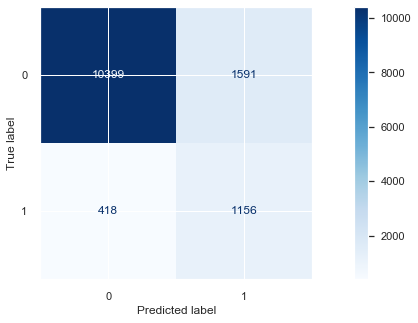

In [192]:
disp_bgcl=plot_confusion_matrix(bgcl,X_test0,y_test1,cmap='Blues',values_format='3')

In [193]:
disp_bgcl.confusion_matrix

array([[10399,  1591],
       [  418,  1156]])

In [194]:
print(classification_report(y_test1, y_predicted_test_bgcl))

              precision    recall  f1-score   support

           0       0.96      0.87      0.91     11990
           1       0.42      0.73      0.54      1574

    accuracy                           0.85     13564
   macro avg       0.69      0.80      0.72     13564
weighted avg       0.90      0.85      0.87     13564



# GRIDSEARCH - BAGGING CLASSIFIER

In [231]:
params1 = {'n_estimators':[500,700], 'max_samples':[.7,1,],}
bgcl = BaggingClassifier(random_state=25)
bgcl_g = GridSearchCV(bgcl,params1, cv=5, n_jobs=-1, return_train_score=True)
bgcl_g.fit(X_train0, y_train_res1)
print('Best parameters:  {}'.format(bgcl_g.best_params_))
print(" Training score",bgcl_g.score(X_train0,y_train_res1))


Best parameters:  {'max_samples': 0.7, 'n_estimators': 700}
 Training score 0.998729056279536


In [232]:
bgcl1 = BaggingClassifier(n_estimators=700, max_samples= .7)
bgcl1.fit(X_train0, y_train_res1)



BaggingClassifier(base_estimator=None, bootstrap=True, bootstrap_features=False,
                  max_features=1.0, max_samples=0.7, n_estimators=700,
                  n_jobs=None, oob_score=False, random_state=None, verbose=0,
                  warm_start=False)

In [233]:
y_probs_train_bgcl1 = bgcl1.predict_proba(X_train0)
y_probs_test_bgcl1 = bgcl1.predict_proba(X_test0)
y_predicted_train_bgcl1 = bgcl1.predict(X_train0)
y_predicted_test_bgcl1 = bgcl1.predict(X_test0)

# keep probabilities for the positive outcome only AFTER GRIDSERACH
y_probs_train_bgcl1 = y_probs_train_bgcl1[:, 1]
y_probs_test_bgcl1 = y_probs_test_bgcl1[:, 1]
    
# calculate AUC and Accuracy AFTER GRIDSERACH
train_auc_bgcl1 = roc_auc_score(y_train_res1, y_probs_train_bgcl1)
test_auc_bgcl1 = roc_auc_score(y_test1, y_probs_test_bgcl1)
train_acc_bgcl1 = accuracy_score(y_train_res1, y_predicted_train_bgcl1)
test_acc_bgcl1 = accuracy_score(y_test1, y_predicted_test_bgcl1)
print('*'*50)
print('Train AUC: %.3f' % train_auc_bgcl1)
print('Test AUC: %.3f' % test_auc_bgcl1)
print('*'*50)
print('Train Accuracy: %.3f' % train_acc_bgcl1)
print('Test Accuracy: %.3f' % test_acc_bgcl1)

score['bgcl1'] = [test_auc_bgcl1, test_acc_bgcl1]  

**************************************************
Train AUC: 1.000
Test AUC: 0.908
**************************************************
Train Accuracy: 0.999
Test Accuracy: 0.883


In [234]:
print(" Training score",bgcl1.score(X_train0,y_train_res1))

 Training score 0.9988543605900043


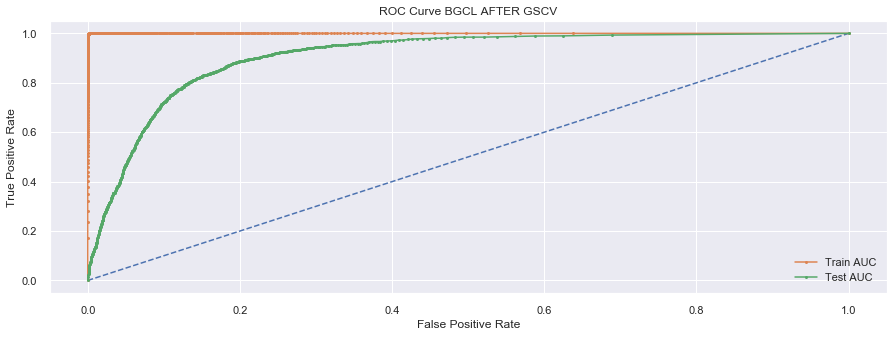

In [235]:
# calculate roc curve
train_fpr_bgcl1, train_tpr_bgcl1, train_thresholds_bgcl1 = roc_curve(y_train_res1, y_probs_train_bgcl1)
test_fpr_bgcl1, test_tpr_bgcl1, test_thresholds_bgcl1 = roc_curve(y_test1, y_probs_test_bgcl1)
plt.plot([0, 1], [0, 1], linestyle='--') 
# plot the roc curve for the model
plt.plot(train_fpr_bgcl1, train_tpr_bgcl1, marker='.', label='Train AUC')  
plt.plot(test_fpr_bgcl1, test_tpr_bgcl1, marker='.', label='Test AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve BGCL AFTER GSCV")
plt.show()

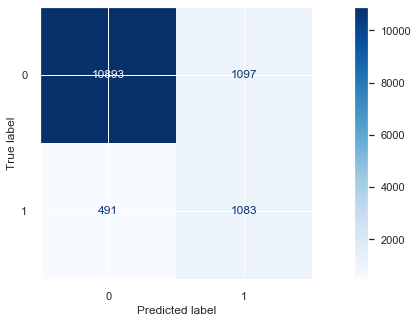

In [236]:
disp_bgcl1=plot_confusion_matrix(bgcl1,X_test0,y_test1,cmap='Blues',values_format='3')

In [237]:
disp_bgcl1.confusion_matrix #AFTER GRIDSEARCH

array([[10893,  1097],
       [  491,  1083]])

## ANALYSIS OF CONFUSION MATRIX-BAGGING CLASSIFIER AFTER DELETION OF UNIMPORTANT FEATURE

TRUE POSITIVE(TP): The model correctly predicted that 1083 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 10893 people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 1097 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 491 people will not take term deposit, but they did took term deposit 

In [241]:
print(classification_report(y_test1,y_predicted_test_bgcl1))# AFTER GRIDSEARCH

              precision    recall  f1-score   support

           0       0.96      0.91      0.93     11990
           1       0.50      0.69      0.58      1574

    accuracy                           0.88     13564
   macro avg       0.73      0.80      0.75     13564
weighted avg       0.90      0.88      0.89     13564



## ANALYSIS OF BAGGING CLASSIFIER MODEL
Precision of 0 (the client said no) represents that for all instances predicted as no subscription, the percentage of clients that actually said no is 96%. Recall is the ability of a classifier to find all positive instances. Recall of 0 indicates that for all clients that actually said no, the model predicts 91% correctly that they would decline the offer. Accuracy score is the percentage of correct predictions out of all predictions made. The BAGGING algorithm achieves an accuracy of 88%, suggesting GOOD level of strength of this model to classify the customer response given all the defined customer features.

# XGBOOST

In [242]:
import xgboost as xgb
from xgboost import XGBClassifier # most important 
xgboost = XGBClassifier(learning_rate =0.05, n_estimators=300, max_depth=5)

In [243]:
xgboost = XGBClassifier(learning_rate =0.05, n_estimators=300, max_depth=5)
xgboost.fit(X_train0, y_train_res1)
y_probs_train_xgboost = xgboost.predict_proba(X_train0)
y_probs_test_xgboost = xgboost.predict_proba(X_test0)
y_predicted_train_xgboost = xgboost.predict(X_train0)
y_predicted_test_xgboost = xgboost.predict(X_test0)

# keep probabilities for the positive outcome only
y_probs_train_xgboost = y_probs_train_xgboost[:, 1]
y_probs_test_xgboost = y_probs_test_xgboost[:, 1]
 
# calculate AUC and Accuracy
train_auc_xgboost = roc_auc_score(y_train_res1, y_probs_train_xgboost)
test_auc_xgboost = roc_auc_score(y_test1, y_probs_test_xgboost)
train_acc_xgboost = accuracy_score(y_train_res1, y_predicted_train_xgboost)
test_acc_xgboost = accuracy_score(y_test1, y_predicted_test_xgboost)
print('*'*50)
print('Train AUC: %.3f' % train_auc_xgboost)
print('Test AUC: %.3f' % test_auc_xgboost)
print('*'*50)
print('Train Accuracy: %.3f' % train_acc_xgboost)
print('Test Accuracy: %.3f' % test_acc_xgboost)

score['xgboost'] = [test_auc_xgboost, test_acc_xgboost] 

**************************************************
Train AUC: 0.983
Test AUC: 0.916
**************************************************
Train Accuracy: 0.932
Test Accuracy: 0.882


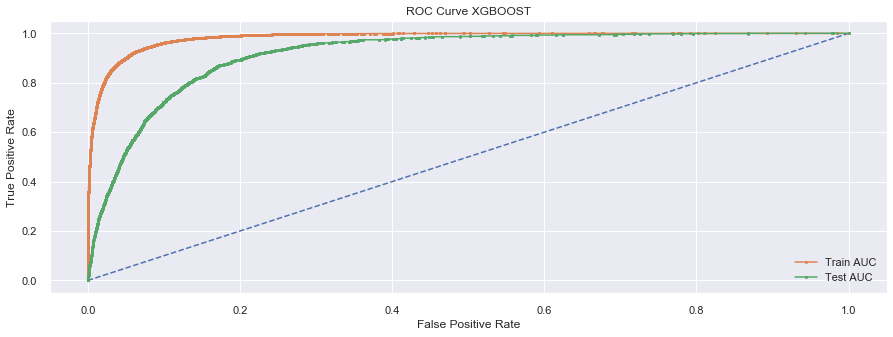

In [244]:
# calculate roc curve
train_fpr_xgboost, train_tpr_xgboost, train_thresholds_xgboost = roc_curve(y_train_res1, y_probs_train_xgboost)
test_fpr_xgboost, test_tpr_xgboost, test_thresholds_xgboost = roc_curve(y_test1, y_probs_test_xgboost)
plt.plot([0, 1], [0, 1], linestyle='--') 
# plot the roc curve for the model
plt.plot(train_fpr_xgboost, train_tpr_xgboost, marker='.', label='Train AUC')  
plt.plot(test_fpr_xgboost, test_tpr_xgboost, marker='.', label='Test AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve XGBOOST")
plt.show() 

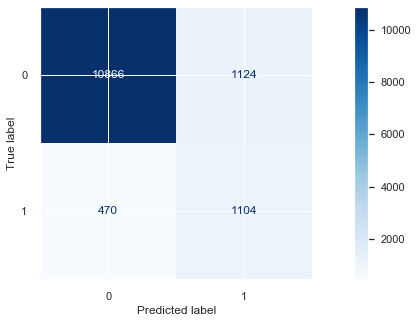

In [245]:
disp_xgboost=plot_confusion_matrix(xgboost,X_test0,y_test1,cmap='Blues',values_format='3')

In [246]:
disp_xgboost.confusion_matrix

array([[10866,  1124],
       [  470,  1104]])

In [247]:
print(classification_report(y_test1, y_predicted_test_xgboost))

              precision    recall  f1-score   support

           0       0.96      0.91      0.93     11990
           1       0.50      0.70      0.58      1574

    accuracy                           0.88     13564
   macro avg       0.73      0.80      0.76     13564
weighted avg       0.90      0.88      0.89     13564



# GRIDSEARCH-XGBOOST

In [248]:
def boost_grid_search(X,y,nfolds): # nfolds = 5,4 -- 30*4 = 120 models
    #create a dictionary of all values we want to test
    param_grid = {'n_estimators':[400,500], 'learning_rate':[.05,1], 'max_depth':[20,22],'gamma':[.3,.4]}
    boostt =XGBClassifier(n_jobs=-1)

    boost_gscv = GridSearchCV(boostt, param_grid, cv=nfolds) # 2 - modelName, paramters, cv
    #fit model to data
    boost_gscv.fit(X_train0, y_train_res1) # X,y - train because you always fit on the train 
    #find score
    score = boost_gscv.score(X_test0, y_test1) # score
    best_params = boost_gscv.best_params_
    
    return best_params, score, boost_gscv 

In [249]:
best_param, acc_boost_gs, boost_gs = boost_grid_search(X_train0,y_train_res1, 5) # after SMOTE
acc_val_boost_gs = boost_gs.score(X_test0, y_test1)

In [250]:
print(best_param)

{'gamma': 0.3, 'learning_rate': 0.05, 'max_depth': 22, 'n_estimators': 500}


In [251]:
print(acc_boost_gs, acc_val_boost_gs) 

0.8923621350634031 0.8923621350634031


In [252]:
xgboost2 = XGBClassifier(learning_rate =.05, n_estimators=500, max_depth=22) #AFTER GRIDSEARCH
xgboost2.fit(X_train0, y_train_res1)
y_probs_train_xgboost2 = xgboost2.predict_proba(X_train0)
y_probs_test_xgboost2 = xgboost2.predict_proba(X_test0) 
y_predicted_train_xgboost2 = xgboost2.predict(X_train0)
y_predicted_test_xgboost2 = xgboost2.predict(X_test0)
 
# keep probabilities for the positive outcome only
y_probs_train_xgboost2 = y_probs_train_xgboost2[:, 1]
y_probs_test_xgboost2 = y_probs_test_xgboost2[:, 1]
 
# calculate AUC and Accuracy
train_auc_xgboost2 = roc_auc_score(y_train_res1, y_probs_train_xgboost2)
test_auc_xgboost2 = roc_auc_score(y_test1, y_probs_test_xgboost2)
train_acc_xgboost2 = accuracy_score(y_train_res1, y_predicted_train_xgboost2)
test_acc_xgboost2 = accuracy_score(y_test1, y_predicted_test_xgboost2)
print('*'*50)
print('Train AUC: %.3f' % train_auc_xgboost2)
print('Test AUC: %.3f' % test_auc_xgboost2)
print('*'*50)
print('Train Accuracy: %.3f' % train_acc_xgboost2)
print('Test Accuracy: %.3f' % test_acc_xgboost2)

score['xgboost2'] = [test_auc_xgboost2, test_acc_xgboost2]  



**************************************************
Train AUC: 1.000
Test AUC: 0.919
**************************************************
Train Accuracy: 1.000
Test Accuracy: 0.894


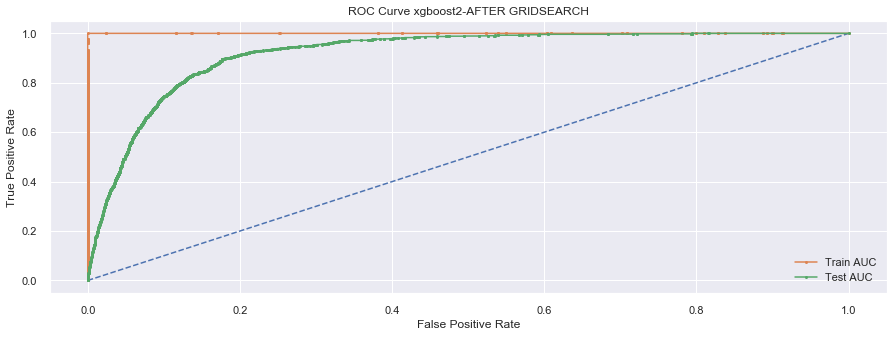

In [452]:
# calculate roc curve
train_fpr_xgboost2, train_tpr_xgboost2, train_thresholds_xgboost2 = roc_curve(y_train_res1, y_probs_train_xgboost2)
test_fpr_xgboost2, test_tpr_xgboost2, test_thresholds_xgboost2 = roc_curve(y_test1, y_probs_test_xgboost2)
plt.plot([0, 1], [0, 1], linestyle='--') 
# plot the roc curve for the model
plt.plot(train_fpr_xgboost2, train_tpr_xgboost2, marker='.', label='Train AUC')  
plt.plot(test_fpr_xgboost2, test_tpr_xgboost2, marker='.', label='Test AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve xgboost2-AFTER GRIDSEARCH")
plt.show()

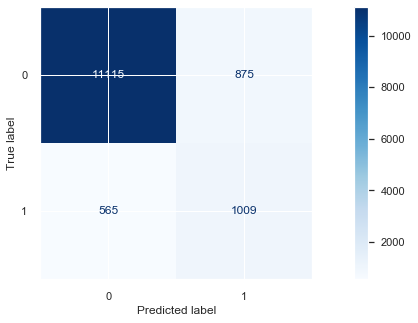

In [254]:
disp_xgboost2=plot_confusion_matrix(xgboost2,X_test0,y_test1,cmap='Blues',values_format='3')

In [255]:
disp_xgboost2.confusion_matrix

array([[11115,   875],
       [  565,  1009]])

## ANALYSIS OF CONFUSION MATRIX-XGBOOST AFTER DELETION OF UNIMPORTANT FEATURE

TRUE POSITIVE(TP): The model correctly predicted that 1009 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 11115 people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 875 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 565 people will not take term deposit, but they did took term deposit 

In [256]:
print(classification_report(y_test1, y_predicted_test_xgboost2))

              precision    recall  f1-score   support

           0       0.95      0.93      0.94     11990
           1       0.54      0.64      0.58      1574

    accuracy                           0.89     13564
   macro avg       0.74      0.78      0.76     13564
weighted avg       0.90      0.89      0.90     13564



## ANALYSIS OF XGBOOST MODEL
Precision of 0 (the client said no) represents that for all instances predicted as no subscription, the percentage of clients that actually said no is 95%. Recall is the ability of a classifier to find all positive instances. Recall of 0 indicates that for all clients that actually said no, the model predicts 93% correctly that they would decline the offer. Accuracy score is the percentage of correct predictions out of all predictions made. The XGBOOST algorithm achieves an accuracy of 89%, suggesting GOODlevel of strength of this model to classify the customer response given all the defined customer features.

# GRADIENT BOOSTING CLASSIFIER

In [257]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier()

In [258]:
gbcl.fit(X_train0, y_train_res1)
y_probs_train_gbcl = gbcl.predict_proba(X_train0)
y_probs_test_gbcl = gbcl.predict_proba(X_test0)
y_predicted_train_gbcl = gbcl.predict(X_train0)
y_predicted_test_gbcl = gbcl.predict(X_test0)
 
# keep probabilities for the positive outcome only
y_probs_train_gbcl = y_probs_train_gbcl[:, 1]
y_probs_test_gbcl = y_probs_test_gbcl[:, 1]
 
# calculate AUC and  Accuracy
train_auc_gbcl = roc_auc_score(y_train_res1, y_probs_train_gbcl)
test_auc_gbcl = roc_auc_score(y_test1, y_probs_test_gbcl)
train_acc_gbcl = accuracy_score(y_train_res1, y_predicted_train_gbcl)
test_acc_gbcl = accuracy_score(y_test1, y_predicted_test_gbcl)
print('*'*50)
print('Train AUC: %.3f' % train_auc_gbcl)
print('Test AUC: %.3f' % test_auc_gbcl)
print('*'*50)
print('Train Accuracy: %.3f' % train_acc_gbcl)
print('Test Accuracy: %.3f' % test_acc_gbcl)

score['gbcl'] = [test_auc_gbcl, test_acc_gbcl]  



**************************************************
Train AUC: 0.968
Test AUC: 0.901
**************************************************
Train Accuracy: 0.905
Test Accuracy: 0.865


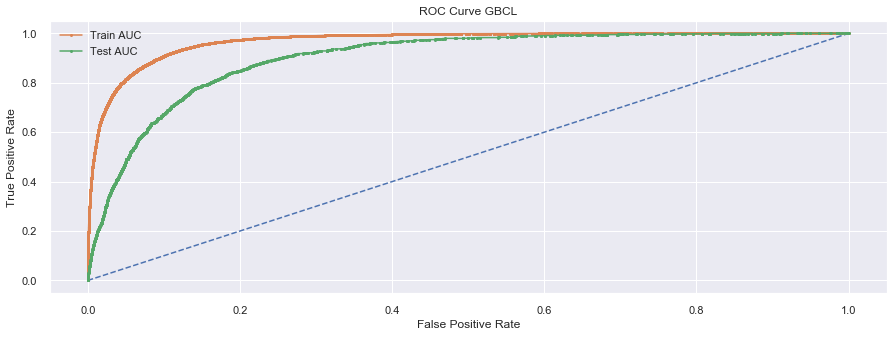

In [259]:
# calculate roc curve
train_fpr_gbcl, train_tpr_gbcl, train_thresholds_gbcl = roc_curve(y_train_res1, y_probs_train_gbcl)
test_fpr_gbcl, test_tpr_gbcl, test_thresholds_gbcl = roc_curve(y_test1, y_probs_test_gbcl)
plt.plot([0, 1], [0, 1], linestyle='--') 
# plot the roc curve for the model
plt.plot(train_fpr_gbcl, train_tpr_gbcl, marker='.', label='Train AUC')   
plt.plot(test_fpr_gbcl, test_tpr_gbcl, marker='.', label='Test AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve GBCL")
plt.show()

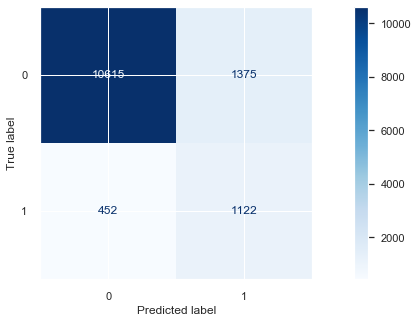

In [260]:
disp_gbcl=plot_confusion_matrix(gbcl,X_test0,y_test1,cmap='Blues',values_format='3')

In [261]:
disp_gbcl.confusion_matrix

array([[10615,  1375],
       [  452,  1122]])

In [262]:
print(classification_report(y_test1, y_predicted_test_gbcl))

              precision    recall  f1-score   support

           0       0.96      0.89      0.92     11990
           1       0.45      0.71      0.55      1574

    accuracy                           0.87     13564
   macro avg       0.70      0.80      0.74     13564
weighted avg       0.90      0.87      0.88     13564



# GRIDSEARCH-GRADIENT BOOSTING CLASSIFIER

In [281]:
params1 = {'n_estimators':[300,500], 'max_depth':[10,15],'learning_rate':[.05,.2]}
gbcl1 = GradientBoostingClassifier()
gbcl_g = RandomizedSearchCV(gbcl1,params1, cv=5, n_jobs=-1, return_train_score=True)
gbcl_g.fit(X_train0, y_train_res1)
print('Best parameters:  {}'.format(gbcl_g.best_params_))
print(" Training score",gbcl_g.score(X_train0,y_train_res1)) 

Best parameters:  {'n_estimators': 500, 'max_depth': 10, 'learning_rate': 0.2}
 Training score 1.0


In [276]:
gbcl4 = GradientBoostingClassifier(n_estimators=500, max_depth=10,learning_rate=.2,max_features=4)
gbcl4.fit(X_train0, y_train_res1)
y_probs_train_gbcl4 = gbcl4.predict_proba(X_train0)
y_probs_test_gbcl4 = gbcl4.predict_proba(X_test0)
y_predicted_train_gbcl4 = gbcl4.predict(X_train0)
y_predicted_test_gbcl4 = gbcl4.predict(X_test0)
 
# keep probabilities for the positive outcome only
y_probs_train_gbcl4 = y_probs_train_gbcl4[:, 1]
y_probs_test_gbcl4 = y_probs_test_gbcl4[:, 1]
 
# calculate AUC and Accuracygfgbcl4

train_auc_gbcl4 = roc_auc_score(y_train_res1, y_probs_train_gbcl4)
test_auc_gbcl4 = roc_auc_score(y_test1, y_probs_test_gbcl4)
train_acc_gbcl4 = accuracy_score(y_train_res1, y_predicted_train_gbcl4)
test_acc_gbcl4 = accuracy_score(y_test1, y_predicted_test_gbcl4)
print('*'*50)
print('Train AUC: %.3f' % train_auc_gbcl4)
print('Test AUC: %.3f' % test_auc_gbcl4)
print('*'*50)
print('Train Accuracy: %.3f' % train_acc_gbcl4)
print('Test Accuracy: %.3f' % test_acc_gbcl4)

score['gbcl4'] = [test_auc_gbcl4, test_acc_gbcl4]  

**************************************************
Train AUC: 1.000
Test AUC: 0.915
**************************************************
Train Accuracy: 1.000
Test Accuracy: 0.897


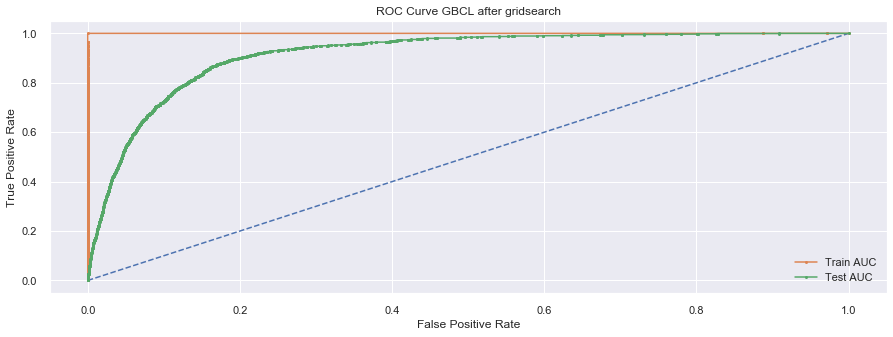

In [352]:
# calculate roc curve
train_fpr_gbcl4, train_tpr_gbcl4, train_thresholds_gbcl4 = roc_curve(y_train_res1, y_probs_train_gbcl4)
test_fpr_gbcl4, test_tpr_gbcl4, test_thresholds_gbcl4 = roc_curve(y_test1, y_probs_test_gbcl4)
plt.plot([0, 1], [0, 1], linestyle='--') 
# plot the roc curve for the model
plt.plot(train_fpr_gbcl4, train_tpr_gbcl4, marker='.', label='Train AUC')  
plt.plot(test_fpr_gbcl4, test_tpr_gbcl4, marker='.', label='Test AUC')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve GBCL after gridsearch")
plt.show()

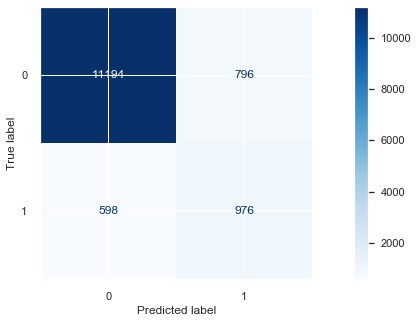

In [353]:
disp_gbcl4=plot_confusion_matrix(gbcl4,X_test0,y_test1,cmap='Blues',values_format='3')

In [354]:
disp_gbcl4.confusion_matrix

array([[11194,   796],
       [  598,   976]])

## ANALYSIS OF CONFUSION MATRIX-GRADIENT BOOST AFTER DELETION OF UNIMPORTANT FEATURE

TRUE POSITIVE(TP): The model correctly predicted that 976 people will take term deposit.

TRUE NEGATIVES(TN):The model correctly predicted that 11194 people will not take term deposit.

FALSE POSITIVE(FP) :(TYPE-1 error)The model incorrectly predicted that 796 people will take term deposit, but they did not took term deposit.

FALSE NEGATIVE(FN) :(TYPE-2 error)The model incorrectly predicted that 598 people will not take term deposit, but they did took term deposit 

In [355]:
print(classification_report(y_test1, y_predicted_test_gbcl4))

              precision    recall  f1-score   support

           0       0.95      0.93      0.94     11990
           1       0.55      0.62      0.58      1574

    accuracy                           0.90     13564
   macro avg       0.75      0.78      0.76     13564
weighted avg       0.90      0.90      0.90     13564



## ANALYSIS OF NAIVE BAYES MODEL
Precision of 0 (the client said no) represents that for all instances predicted as no subscription, the percentage of clients that actually said no is 95%. Recall is the ability of a classifier to find all positive instances. Recall of 0 indicates that for all clients that actually said no, the model predicts 93% correctly that they would decline the offer. Accuracy score is the percentage of correct predictions out of all predictions made. The NB algorithm achieves an accuracy of 90%, suggesting HIGH level of strength of this model to classify the customer response given all the defined customer features.

# COMPARING ALL MODELS ROC CURVE IN ONE

In [358]:
log_new=LogisticRegression()
nb1=GaussianNB()
knn2=KNeighborsClassifier()
svc_model_rbf2=SVC()
DT_m=DecisionTreeClassifier()
rf_model=RandomForestClassifier() 
abcl1=AdaBoostClassifier()
bgcl1=BaggingClassifier()
gbcl4=GradientBoostingClassifier()
xgboost2=XGBClassifier()





In [375]:
log_new.fit(X_train0, y_train_res1);
knn2.fit(X_train0,y_train_res1);
svc_model_rbf2.fit(X_train0,y_train_res1);
nb1.fit(X_train0,y_train_res1);
DT_m.fit(X_train0,y_train_res1);
rf_model.fit(X_train0,y_train_res1);
abcl1.fit(X_train0,y_train_res1);
bgcl1.fit(X_train0,y_train_res1);
gbcl4.fit(X_train0,y_train_res1);
xgboost2.fit(X_train0,y_train_res1);

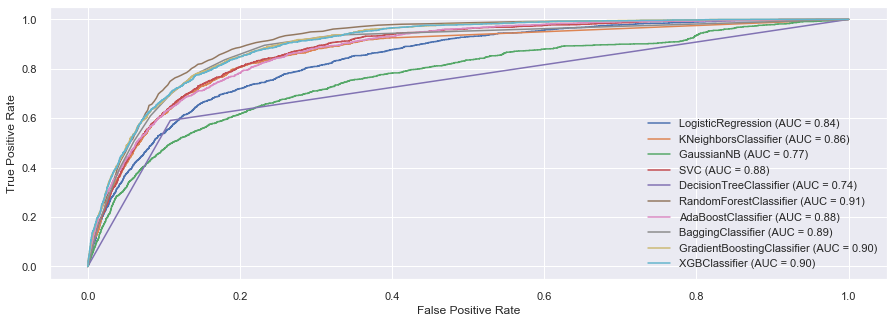

In [376]:
from sklearn.metrics import plot_roc_curve
 disp= plot_roc_curve(log_new,X_test0,y_test1)
plot_roc_curve(knn2,X_test0,y_test1,ax=disp.ax_);
plot_roc_curve(nb1,X_test0,y_test1,ax=disp.ax_);
plot_roc_curve(svc_model_rbf2,X_test0,y_test1,ax=disp.ax_);
plot_roc_curve(DT_m,X_test0,y_test1,ax=disp.ax_);
plot_roc_curve(rf_model,X_test0,y_test1,ax=disp.ax_);
plot_roc_curve(abcl1,X_test0,y_test1,ax=disp.ax_);
plot_roc_curve(bgcl1,X_test0,y_test1,ax=disp.ax_);
plot_roc_curve(gbcl4,X_test0,y_test1,ax=disp.ax_);
plot_roc_curve(xgboost2,X_test0,y_test1,ax=disp.ax_);

In [377]:
from sklearn import model_selection
from sklearn.model_selection import cross_val_score


Avoiding Overfitting:

Brief Description of Overfitting?
This is an error in the modeling algorithm that takes into consideration random noise in the fitting process rather than the pattern itself. You can see that this occurs when the model gets an awsome score in the training set but when we use the test set (Unknown data for the model) we get an awful score. This is likely to happen because of overfitting of the data (taking into consideration random noise in our pattern). What we want our model to do is to take the overall pattern of the data in order to correctly classify whether a potential client will suscribe to a term deposit or not. In the examples above, it is most likely that the Decision Tree Classifier and Random Forest classifiers are overfitting since they both give us nearly perfect scores (100% and 99%) accuracy scores. 


How can we avoid Overfitting?
The best alternative to avoid overfitting is to use cross validation. Taking the training test and splitting it. For instance, if we split it by 3, 2/3 of the data or 66% will be used for training and 1/3 33% will be used or testing and we will do the testing process three times. This algorithm will iterate through all the training and test sets and the main purpose of this is to grab the overall pattern of the data.

# CROSS VALIDATION SCORE TO COMPARE MODELS

LR: 0.885686 (0.023488)
NB: 0.873027 (0.054782)
KNN: 0.884431 (0.007228)
DT: 0.778513 (0.109419)
RF: 0.852929 (0.053468)
ABC: 0.881328 (0.038396)
BGC: 0.831004 (0.083935)
GBC: 0.869208 (0.054324)
XGB: 0.872461 (0.050260)
SVC: 0.883060 (0.000401)


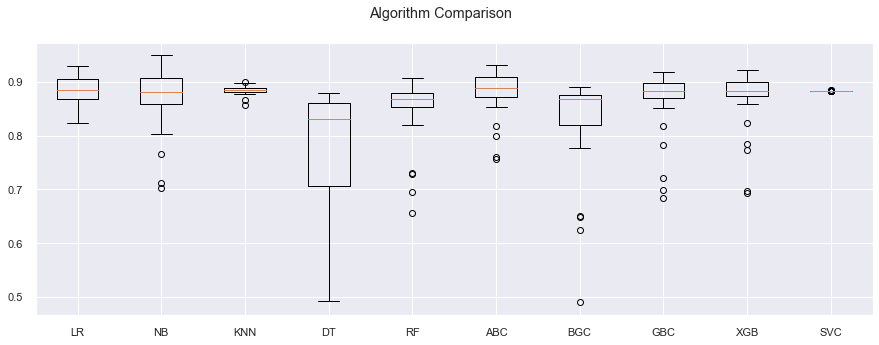

In [384]:
seed = 25
# prepare models
models = []
models.append(('LR', log_new))
models.append(('NB', nb1))
models.append(('KNN', knn2))
models.append(('DT', DT_m))
models.append(('RF', rf_model))
models.append(('ABC', abcl1))
models.append(('BGC', bgcl1))
models.append(('GBC', gbcl4))
models.append(('XGB', xgboost2))
models.append(('SVC', svc_model_rbf2))

# evaluate each model in turn

results = []
names = []
scoring = 'accuracy'
for name, model in models:
	kfold = model_selection.KFold(n_splits=25, random_state=seed)
	cv_results = model_selection.cross_val_score(model,Xd,yd,cv=40, scoring=scoring)
	results.append(cv_results)
	names.append(name)  
	msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
	print(msg)
# boxplot algorithm comparison
fig = plt.figure()  
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()  

LR: -0.114314 (0.023488)
NB: -0.126973 (0.054782)
KNN: -0.115569 (0.007228)
DT: -0.224561 (0.113176)
RF: -0.147601 (0.054236)
ABC: -0.118672 (0.038396)
BGC: -0.167691 (0.085585)
GBC: -0.130792 (0.054324)
XGB: -0.127539 (0.050260)
SVC: -0.116940 (0.000401)


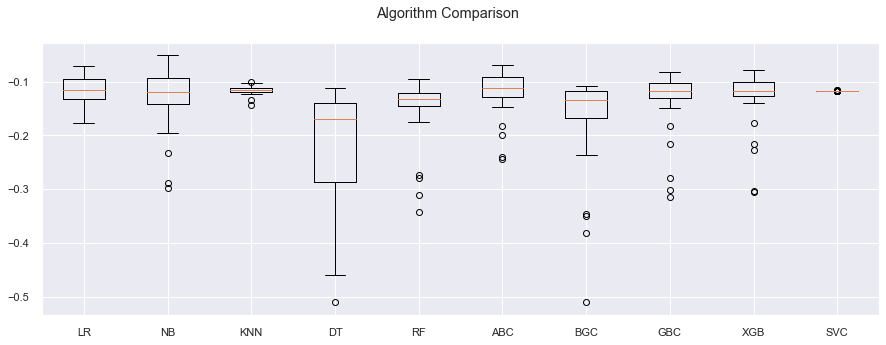

In [386]:
seed = 25
# prepare models
models = []
models.append(('LR', log_new))
models.append(('NB', nb1))
models.append(('KNN', knn2))
models.append(('DT', DT_m))
models.append(('RF', rf_model))
models.append(('ABC', abcl1))
models.append(('BGC', bgcl1))
models.append(('GBC', gbcl4))
models.append(('XGB', xgboost2))
models.append(('SVC', svc_model_rbf2))

# evaluate each model in turn

results = []
names = []
scoring = 'neg_mean_squared_error'
for name, model in models:
	kfold = model_selection.KFold(n_splits=25, random_state=seed)
	cv_results = model_selection.cross_val_score(model,Xd,yd,cv=40, scoring=scoring)
	results.append(cv_results)
	names.append(name)  
	msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
	print(msg)
# boxplot algorithm comparison
fig = plt.figure()  
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()  

# PRECESION RECALL TRADE OFF

Average precision-recall score LR: 0.11604246534945444


Text(0.5, 1.0, '2-class Precision-Recall curve: LR=0.12')

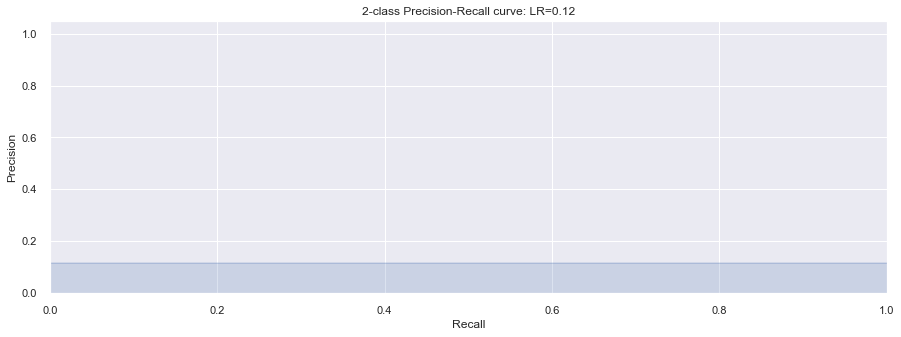

In [410]:
from sklearn.metrics import average_precision_score, auc, roc_curve, precision_recall_curve

precision, recall, _ = precision_recall_curve(y_test1, y_probs_test12) # LOGISTIC REGRESSION


average_precision = average_precision_score(y_test1,y_probs_test12)

print('Average precision-recall score LR: {}'.format(average_precision))

plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2,
                 color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: LR={0:0.2f}'.format(
          average_precision))

Average precision-recall score KNN: 0.4590699688852442


Text(0.5, 1.0, '2-class Precision-Recall curve: KNN=0.46')

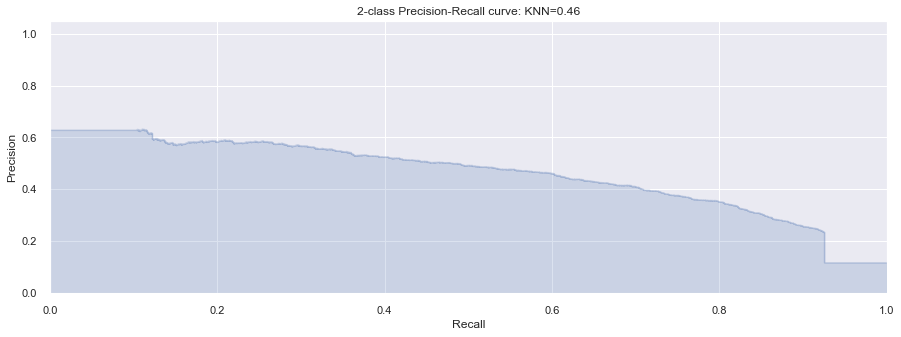

In [411]:
from sklearn.metrics import average_precision_score, auc, roc_curve, precision_recall_curve

precision, recall, _ = precision_recall_curve(y_test1,y_probs_test_knn2) # KNN


average_precision = average_precision_score(y_test1,y_probs_test_knn2)

print('Average precision-recall score KNN: {}'.format(average_precision))

plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2,
                 color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: KNN={0:0.2f}'.format(
          average_precision))

Average precision-recall score NB: 0.3503839291174521


Text(0.5, 1.0, '2-class Precision-Recall curve: NB=0.35')

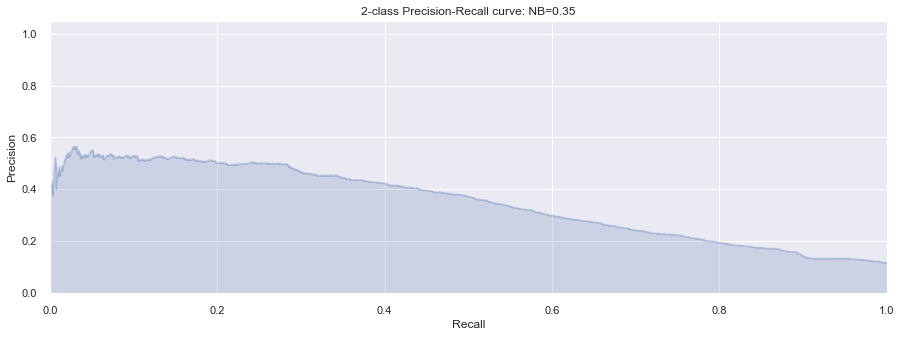

In [412]:
from sklearn.metrics import average_precision_score, auc, roc_curve, precision_recall_curve

precision, recall, _ = precision_recall_curve(y_test1,y_probs_test_nb1) # NAIVE BAYES


average_precision = average_precision_score(y_test1,y_probs_test_nb1)

print('Average precision-recall score NB: {}'.format(average_precision))

plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2,
                 color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: NB={0:0.2f}'.format(
          average_precision))

Average precision-recall score SVC: 0.48847058021310574


Text(0.5, 1.0, '2-class Precision-Recall curve: SVC=0.49')

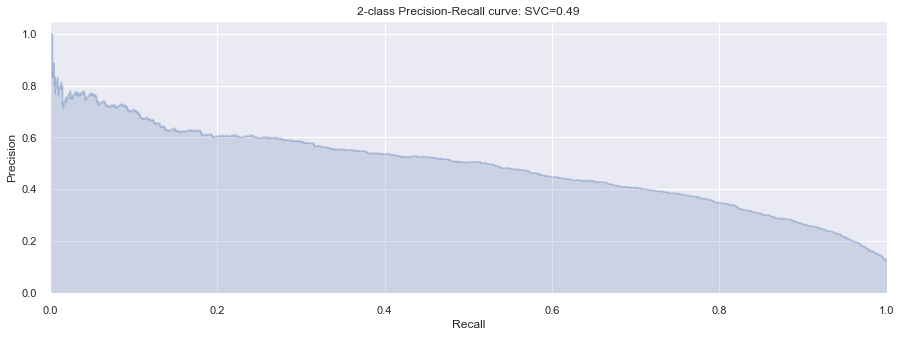

In [422]:
from sklearn.metrics import average_precision_score, auc, roc_curve, precision_recall_curve 
precision, recall, _ = precision_recall_curve(y_test1,ylog_proba_rbf21) # SUPPORT VECTOR MACHINES

average_precision = average_precision_score(y_test1,ylog_proba_rbf21)

print('Average precision-recall score SVC: {}'.format(average_precision))

plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2,
                 color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: SVC={0:0.2f}'.format(
          average_precision))

Average precision-recall score dt: 0.491152274912201


Text(0.5, 1.0, '2-class Precision-Recall curve: DT=0.49')

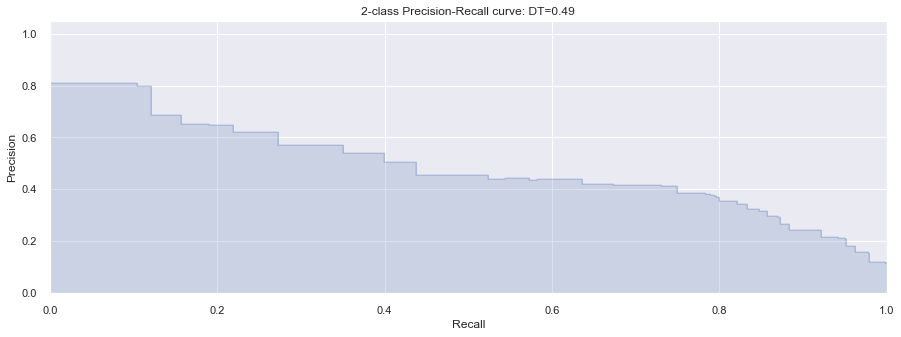

In [424]:
from sklearn.metrics import average_precision_score, auc, roc_curve, precision_recall_curve

precision, recall, _ = precision_recall_curve(y_test1,ylog_proba_dtm[:,1]) # DECESION TREE


average_precision = average_precision_score(y_test1,ylog_proba_dtm[:,1])

print('Average precision-recall score dt: {}'.format(average_precision))

plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2,
                 color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: DT={0:0.2f}'.format(
          average_precision))

Average precision-recall score RF: 0.48594278195850943


Text(0.5, 1.0, '2-class Precision-Recall curve: RF=0.49')

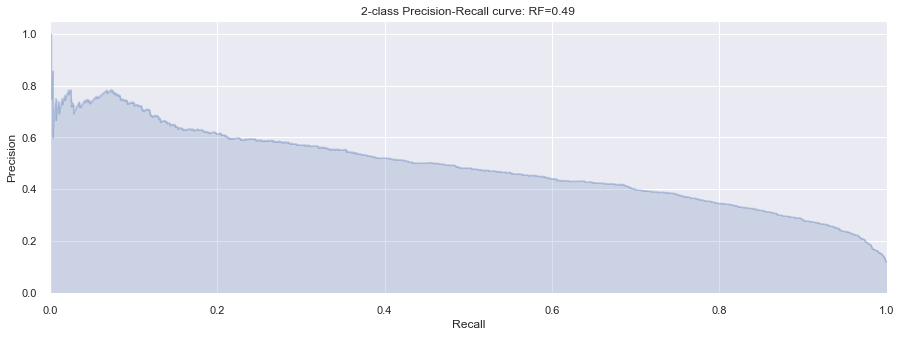

In [426]:
from sklearn.metrics import average_precision_score, auc, roc_curve, precision_recall_curve

precision, recall, _ = precision_recall_curve(y_test1,y_probs_test_rf_model) # RANDOM FOREST


average_precision = average_precision_score(y_test1,y_probs_test_rf_model)

print('Average precision-recall score RF: {}'.format(average_precision))

plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2,
                 color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: RF={0:0.2f}'.format(
          average_precision))

Average precision-recall score ABCL: 0.5279563005268135


Text(0.5, 1.0, '2-class Precision-Recall curve: ABCL=0.53')

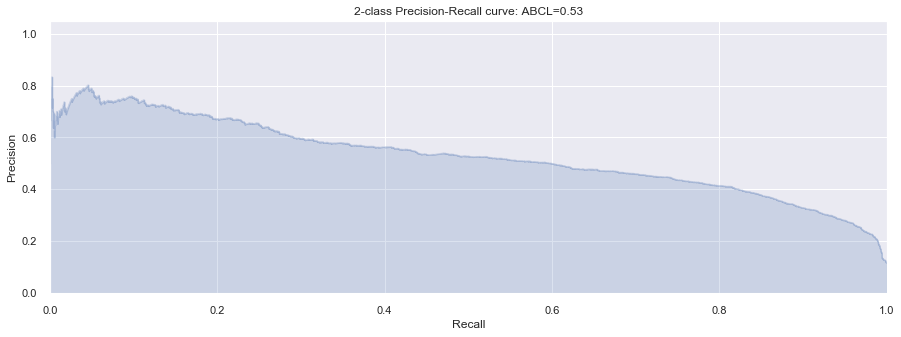

In [427]:
from sklearn.metrics import average_precision_score, auc, roc_curve, precision_recall_curve

precision, recall, _ = precision_recall_curve(y_test1,y_probs_test_abcl1) # ADABOOST CLASSIFIER


average_precision = average_precision_score(y_test1,y_probs_test_abcl1)

print('Average precision-recall score ABCL: {}'.format(average_precision))

plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2,
                 color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: ABCL={0:0.2f}'.format(
          average_precision))

Average precision-recall score BGCL: 0.532048381775943


Text(0.5, 1.0, '2-class Precision-Recall curve: BGCL=0.53')

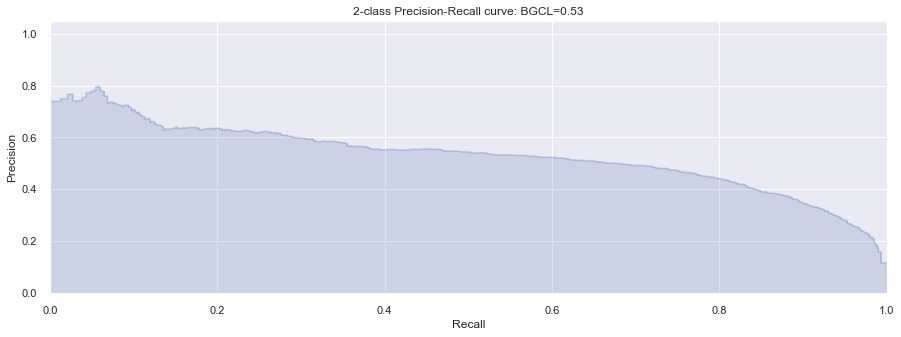

In [428]:
from sklearn.metrics import average_precision_score, auc, roc_curve, precision_recall_curve

precision, recall, _ = precision_recall_curve(y_test1,y_probs_test_bgcl1) # BAGGING CLASSIFIER


average_precision = average_precision_score(y_test1,y_probs_test_bgcl1)

print('Average precision-recall score BGCL: {}'.format(average_precision))

plt.step(recall, precision, color='b', alpha=0.2,
         where='post') 
plt.fill_between(recall, precision, step='post', alpha=0.2,
                 color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: BGCL={0:0.2f}'.format(
          average_precision))

Average precision-recall score XGBOOST: 0.5594019982946543


Text(0.5, 1.0, '2-class Precision-Recall curve: XGBOOST=0.56')

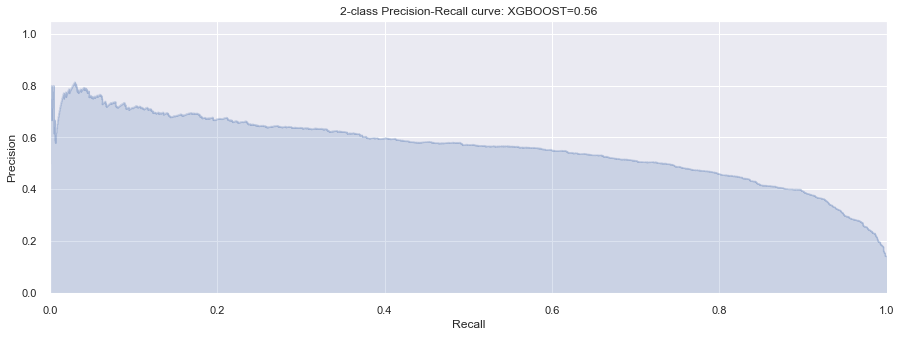

In [429]:
from sklearn.metrics import average_precision_score, auc, roc_curve, precision_recall_curve

precision, recall, _ = precision_recall_curve(y_test1,y_probs_test_xgboost2) # XGBOOST


average_precision = average_precision_score(y_test1,y_probs_test_xgboost2)

print('Average precision-recall score XGBOOST: {}'.format(average_precision))

plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2,
                 color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: XGBOOST={0:0.2f}'.format(
          average_precision))

Average precision-recall score GBCL: 0.5683446244344786


Text(0.5, 1.0, '2-class Precision-Recall curve: GBCL=0.57')

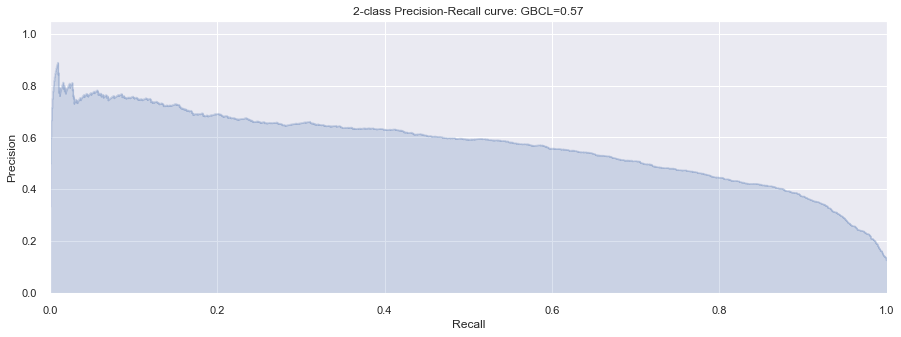

In [430]:
from sklearn.metrics import average_precision_score, auc, roc_curve, precision_recall_curve

precision, recall, _ = precision_recall_curve(y_test1,y_probs_test_gbcl4) # GRADIENT BOOST


average_precision = average_precision_score(y_test1,y_probs_test_gbcl4)

print('Average precision-recall score GBCL: {}'.format(average_precision))

plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2,
                 color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: GBCL={0:0.2f}'.format(
          average_precision))

# ANALYZING THE RESULTS
So now we have to decide which one is the best model, and we have two types of wrong values:

False Positive, means the client do NOT SUBSCRIBED to term deposit, but the model thinks he did.
False Negative, means the client SUBSCRIBED to term deposit, but the model said he dont.
In my opinion:

The first one its most harmful, because we think that we already have that client but we dont and maybe we lost him in other future campaings
The second its not good but its ok, we have that client and in the future we'll discovery that in truth he's already our client
So, our objective here, is to find the best model by confusion matrix with the lowest False Positive as possible.

AS FAR WITH SCORING RELATED TO ACCURACY LOGISTIC MODEL GIVES THE BEST RESULT WITH LOW MEAN ERROR ALSO.

IN THIS SCENARIO WE ARE CONCERNED MORE WITH REDUCING THE TERM 1 ERROR ,THAT IS INCREASING PRECESION RATIO.
SO WE CHOOSE GRADIENT BOOST CLASSIFIER THE BEST MODEL TO CHOOSE WHICH CLIENTS WILL SUBSCRIBE TO A TERM DEPOSIT  REDUCE THE ERROR AND PERFORM BETTER RESULTS 


## Solutions for the Next Marketing Campaign (Conclusion):
1) Months of Marketing Activity: We saw that the the month of highest level of marketing activity was the month of May. However, this was the month that potential clients tended to reject term deposits offers. For the next marketing campaign, it will be wise for the bank to focus the marketing campaign during the months of March, September, October and December. (December should be under consideration because it was the month with the lowest marketing activity, there might be a reason why december is the lowest.)

2) Seasonality: Potential clients opted to suscribe term deposits during the seasons of fall and winter. The next marketing campaign should focus its activity throghout these seasons. 

3) Campaign Calls: A policy should be implemented that states that no more than 3 calls should be applied to the same potential client in order to save time and effort in getting new potential clients. Remember, the more we call the same potential client, the likely he or she will decline to open a term deposit. 

4) Age Category: The next marketing campaign of the bank should target potential clients in their 20s or younger and 60s or older. The youngest category had a 60% chance of suscribing to a term deposit while the eldest category had a 76% chance of suscribing to a term deposit. It will be great if for the next campaign the bank addressed these two categories and therefore, increase the likelihood of more term deposits suscriptions. 

5) Occupation: Not surprisingly, potential clients that were students or retired were the most likely to suscribe to a term deposit. Retired individuals, tend to have more term deposits in order to gain some cash through interest payments. Remember, term deposits are short-term loans in which the individual (in this case the retired person) agrees not to withdraw the cash from the bank until a certain date agreed between the individual and the financial institution. After that time the individual gets its capital back and its interest made on the loan. Retired individuals tend to not spend bigly its cash so they are morelikely to put their cash to work by lending it to the financial institution. Students were the other group that used to suscribe term deposits.

6) House Loans and Balances: Potential clients in the low balance and no balance category were more likely to have a house loan than people in the average and high balance category. What does it mean to have a house loan? This means that the potential client has financial compromises to pay back its house loan and thus, there is no cash for he or she to suscribe to a term deposit account. However, we see that potential clients in the average and hih balances are less likely to have a house loan and therefore, more likely to open a term deposit. Lastly, the next marketing campaign should focus on individuals of average and high balances in order to increase the likelihood of suscribing to a term deposit. 


7) Develop a Questionaire during the Calls: Since duration of the call is the feature that most positively correlates with whether a potential client will open a term deposit or not, by providing an interesting questionaire for potential clients during the calls the conversation length might increase. Of course, this does not assure us that the potential client will suscribe to a term deposit! Nevertheless, we don't loose anything by implementing a strategy that will increase the level of engagement of the potential client leading to an increase probability of suscribing to a term deposit, and therefore an increase in effectiveness for the next marketing campaign the bank will excecute. 


8) Target individuals with a higher duration : Target the target group that is above average in duration, there is a highly likelihood that this target group would open a term deposit account. The likelihood that this group would open a term deposit account is at 78% which is pretty high. This would allow that the success rate of the next marketing campaign would be highly successful.


By combining all these strategies and simplifying the market audience the next campaign should address, it is likely that the next marketing campaign of the bank will be more effective than the current one.